In [1]:
#!/usr/bin/env python

# MCS_Characteristics.ipynb

In [2]:
from dateutil import rrule
import datetime
import glob
from netCDF4 import Dataset
import sys, traceback
import dateutil.parser as dparser
import string
from pdb import set_trace as stop
import numpy as np
import numpy.ma as ma
import os
# from mpl_toolkits import basemap
# import ESMF
import pickle
import subprocess
import pandas as pd
from scipy import stats
import copy
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib as mpl
import pylab as plt
import random
import scipy.ndimage as ndimage
import scipy
import shapefile
import matplotlib.path as mplPath
from matplotlib.patches import Polygon as Polygon2
# Cluster specific modules
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.vq import kmeans2,vq, whiten
from scipy.ndimage import gaussian_filter
# import seaborn as sns
# import metpy.calc as mpcalc
import shapefile as shp
import sys 
import matplotlib.gridspec as gridspec
import seaborn
# from mpl_toolkits.basemap import Basemap, cm
import xarray as xr
import geopandas as gpd
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
from scipy.spatial import ConvexHull
import cartopy.crs as ccrs

def distance(origin, destination):
    lat1, lon1 = origin
    lat2, lon2 = destination
    radius = 6371 # km

    dlat = math.radians(lat2-lat1)
    dlon = math.radians(lon2-lon1)
    a = math.sin(dlat/2) * math.sin(dlat/2) + math.cos(math.radians(lat1)) \
        * math.cos(math.radians(lat2)) * math.sin(dlon/2) * math.sin(dlon/2)
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    d = radius * c

    return d

def runningMeanFast(x, N):
    return np.convolve(x, np.ones((N,))/N)[(N-1):]

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    km = 6367 * c
    return km


###  USER INPUT SECTION

In [3]:
FocMon=[1,2,3,4,5,6,7,8,9,10,11,12]

rgsDataSets=['IMERG','WRF4km']
rgsDataSetsNames=['Observation','South-America 4km']

sStat='seasons'
rgsSeas=['DJF','MAM','JJA','SON']

Grid = 'IMERG'  # options are ['Stage4', 'CONUS2_4km']
Data = 'WRF4'  # options are ['Stage4', 'CONUS2_4km']

Trackers = ['Andreas', 'Julia','Amanda', 'Kelly-Zach', 'Zhe','TOOCAN']
track_name = ['prein', 'kukulies','Rehbein', 'TAMS', 'feng','TOOCAN']
tracker_names = ['MOAAP', 'tobac','ForTraCC', 'TAMS', 'PyFLEXTRKR','TOOCAN']
tr_colors = ['#1f78b4','#33a02c','#e31a1c','#ff7f00','#a6cee3','#6a3d9a']
sPlotDir='/glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/'

# set the font size
plt.rcParams.update({'font.size': 18})
rgsLableABC=list(string.ascii_lowercase)+list(string.ascii_uppercase)

# list of object properies
rgsPropertiesAll=['size','lifetime','speed','tracklength','maxPR','meanPR','totalPR','10-90%','ObjID']
rgsProperties=['size','speed','maxPR','meanPR','totalPR','lifetime','tracklength']

### Read in the constant fields

In [4]:
# IMERGE
ST4Data='/glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/'
WY11 = pd.date_range(datetime.datetime(2010, 6, 1,0), end=datetime.datetime(2011, 5, 31,23), freq='h')
WY16 = pd.date_range(datetime.datetime(2015, 6, 1,0), end=datetime.datetime(2016, 5, 31,23), freq='h')
WY19 = pd.date_range(datetime.datetime(2018, 6, 1,0), end=datetime.datetime(2019, 5, 31,23), freq='h')
rgdTimeST4 = WY11.union(WY16).union(WY19)

WY11 = pd.date_range(datetime.datetime(2010, 6, 1,0), end=datetime.datetime(2011, 5, 31,23), freq='m')
WY16 = pd.date_range(datetime.datetime(2015, 6, 1,0), end=datetime.datetime(2016, 5, 31,23), freq='m')
WY19 = pd.date_range(datetime.datetime(2018, 6, 1,0), end=datetime.datetime(2019, 5, 31,23), freq='m')
TimeMM = WY11.union(WY16).union(WY19)

rgsYears = ['WY2011','WY2016','WY2019']

SEL=np.sum(np.array([(rgdTimeST4.month == FocMon[ii]) for ii in range(len(FocMon))]), axis=0)
rgdTimeST4=rgdTimeST4[SEL == 1]
iTimeS4 = np.array(range(len(rgdTimeST4)))
YYYY_ST4=np.unique(rgdTimeST4.year)
MinCov=0.8
# ds_disk = xr.open_dataset('/glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/data/Andreas/prein_WY2011_OBS_SAAG-MCS-mask-file.nc')
# Lon=np.array(ds_disk['lon'])
# Lat=np.array(ds_disk['lat'])


ncid=Dataset('/glade/campaign/mmm/c3we/prein/SouthAmerica/MCS-Tracking/GPM/2001/merg_2001123110_4km-pixel.nc', mode='r')
Lat=np.squeeze(ncid.variables['lat'][:])
Lon=np.squeeze(ncid.variables['lon'][:])
ncid.close()
Lon,Lat = np.meshgrid(Lon,Lat)
# LatIM=LatIM[250:1050]
# LonIM=LonIM[900:1550]
# Lat,Lon=np.meshgrid(LatIM,LonIM)
# rgrLatST4 = Lat.T
# rgrLonST4 = Lon.T

# if Data == 'WRF4':
#     if Grid == 'IMERG':
#         _modData='/glade/campaign/mmm/c3we/prein/Papers/2020_SouthAmerica/data/TrackAnalysis/'
#     rgdTime_mod = pd.date_range(datetime.datetime(2018, 6, 1,0), end=datetime.datetime(2019, 5, 31,23), freq='h')
#     SEL=np.sum(np.array([(rgdTime_mod.month == FocMon[ii]) for ii in range(len(FocMon))]), axis=0)
#     rgdTime_mod=rgdTime_mod[SEL == 1]
#     YYYY_mod=np.unique(rgdTime_mod.year)
# if Grid == 'IMERG':
#     rgrLat_mod = np.copy(rgrLatST4)
#     rgrLon_mod = np.copy(rgrLonST4)
#     rgrLatC1 = np.copy(rgrLatST4)
#     rgrLonC1 = np.copy(rgrLonST4)

### load the shape files that we want to use for the regional analysis

In [5]:
# sUSSubregions='/glade/u/home/prein/papers/2020_SouthAmerica/Shapefiles/amapoly_ivb'
# ctr = shapefile.Reader(sUSSubregions)
# geomet = ctr.shapeRecords() #will store the geometry separately
# grShapeFiles={}
# for sh in range(len(geomet)):
#     first = geomet[sh]
#     grShapeFiles[first.record[5]]=first.shape.points
# grShapeFiles = {"Amazon Basin" if k == 6725344251419.7 else k:v for k,v in grShapeFiles.items()}


# sUSSubregions='/glade/u/home/prein/papers/2020_SouthAmerica/Shapefiles/LaPlata_fin'
# ctr = shapefile.Reader(sUSSubregions)
# geomet = ctr.shapeRecords() #will store the geometry separately
# for sh in range(len(geomet)):
#     first = geomet[sh]
#     grShapeFiles['LaPlata_fin']=first.shape.points

# sUSSubregions='/glade/u/home/prein/papers/2020_SouthAmerica/Shapefiles/Columbia_fin'
# ctr = shapefile.Reader(sUSSubregions)
# geomet = ctr.shapeRecords() #will store the geometry separately
# for sh in range(len(geomet)):
#     first = geomet[sh]
#     grShapeFiles['Columbia_fin']=first.shape.points
    
    
# # sCanadaMexico='/glade/u/home/prein/papers/2020_CONUS2_MCSs/ShapeFiles/Canada-Mexico'
# # ctr = shapefile.Reader(sCanadaMexico)
# # geomet = ctr.shapeRecords()
# # for sh in range(len(geomet)):
# #     first = geomet[sh]
# #     grShapeFiles[first.record[4]]=first.shape.points

In [6]:
import shapefile
sShapefiles='/glade/u/home/prein/papers/2020_SouthAmerica/Shapefiles/AR6/IPCC-AR6_SouthAmerica_fin.shp'
Regions = ['SCA','CAR','NWS','NSA','SAM','NES','SWS','SES','SSA','EPO','SPO','NAO','EAO','SAO']
SelRegions = ['NWS','NSA','NES','SAM','SES','NAO','EAO','SAO'] #,'SWS','SSA']
sRegNames=Regions

data = shapefile.Reader(sShapefiles, encoding="latin1")
Shapes = data# .to_crs(epsg=4326)

grShapeFiles={}
Coordinates = data.shapeRecords()
for sf in tqdm(range(len(Coordinates))):
    coord = np.array(Coordinates[sf].shape.points)
    x = coord[:,0]
    y = coord[:,1]
    TEST = np.array([x,y]).T
    if Regions[sf] in SelRegions:
        grShapeFiles[Regions[sf]]=TEST

100%|██████████| 14/14 [00:00<00:00, 4463.38it/s]


In [7]:
# sShapefiles='/glade/u/home/prein/papers/2020_SouthAmerica/Shapefiles/AR6/IPCC-AR6_SouthAmerica_fin.shp'
# Regions = ['SCA','CAR','NWS','NSA','SAM','NES','SWS','SES','SSA','EPO','SPO','NAO','EAO','SAO']
# SelRegions = ['NWS','NSA','NES','SAM','SES','NAO','EAO','SAO']
# sRegNames=Regions
# data = gpd.read_file(sShapefiles)
# # change CRS to epsg 4326
# Shapes = data.to_crs(epsg=4326)

# grShapeFiles={}
# Coordinates = data['geometry']
# for sf in tqdm(range(len(data))):
#     x, y = Coordinates[sf].exterior.coords.xy
#     TEST = np.array([x,y]).T
#     if Regions[sf] in SelRegions:
#         grShapeFiles[Regions[sf]]=TEST

### Calculate the Statistics

In [8]:
# Read in Stage IV MCS characteristics

speed_all = {}
lat_all = {}
lon_all = {}
size_all = {}
pr_perc_all = {}
pr_vol_all = {}
pr_mean_all = {}
pr_max_all = {}
pr_P95_all = {}

MCSsPerMonthS4 = np.zeros((len(YYYY_ST4),len(FocMon),len(grShapeFiles.keys()), len(Trackers)))
MCSsPerHour_MM = np.zeros((len(YYYY_ST4),len(FocMon),24,len(grShapeFiles.keys()), len(Trackers)))

for tr in range(len(Trackers)):
    print('-----')
    print('work on '+str(Trackers[tr]))
    StormSpeedS4 = {}
    StormLatS4 = {}
    StormLonS4 = {}
    StormSizeS4 = {}
    PRpercS4 = {}
    PRvolS4 = {}
    PRmeanS4 = {}
    PRmaxS4 = {}
    PRP95S4 = {}


    StormLatS4All = {}
    StormLonS4All = {}
    # Data for tracking visualization
    S4MCStime = list() #np.zeros((1000,300)); S4MCStime[:]=np.nan
    S4LatMCS = list()
    S4LonMCS = list()
    # 'rgrSize', 'rgrPR_Percentiles', 'rgrPR_Vol', 'rgrPR_Mean', 'rgrMassCent', 'rgrObjSpeed', 'rgrAccumulation', 'rgrPR_Max'
    ii = 0
    for yy in range(len(YYYY_ST4)):
        print('    ST4 year '+str(YYYY_ST4[yy]))
    #     for mm in range(len(FocMon)):
    #     FILE=ST4Data+str('WY'+str(YYYY_ST4[yy])+'_IMERG-MERGIR_Prein_SAAG-MCS-tracking.nc_MCS_'+str(int(YYYY_ST4[yy])-1)+'06.pkl')
        FILE = ST4Data + Trackers[tr] + str('_OBS_MCS_WY'+str(int(YYYY_ST4[yy]))+'.pkl')
        if os.path.isfile(FILE) == True:
            file = open(FILE, 'rb')
            DATA=pickle.load(file, encoding='latin1')
            Objects=np.array(list(DATA.keys()))
            for ob in range(len(DATA.keys())):
                OBact=DATA[Objects[ob]]
                Location=OBact['track']; Location=Location[~np.isnan(Location[:,0]),:]
                LAT = Location[:,0]
                LON = Location[:,1]
                SPEED=OBact['speed']
                FIN = ~np.isnan(SPEED)
                SPEED=SPEED[FIN]
                ObID=str(YYYY_ST4[yy])+'06_'+str(ob).zfill(3)
                TIME = pd.to_datetime(OBact['times'])
                iTimeTmp = iTimeS4[np.where(rgdTimeST4 == TIME[0])[0][0] : np.where(rgdTimeST4 == TIME[-1])[0][0]+1]
                S4MCStime.append(iTimeTmp)
                S4LatMCS.append(LAT)
                S4LonMCS.append(LON)

                StormLatS4All[ObID] = LAT
                StormLonS4All[ObID] = LON
                ii = ii + 1
                for sr in range(len(grShapeFiles.keys())):
                    rgrPoly=grShapeFiles[list(grShapeFiles.keys())[sr]]
                    # ActShape = shapely.geometry.Polygon(rgrPoly)
                    ActShape =mplPath.Path(rgrPoly)
                    rStormContained=[ActShape.contains_point((LON[pp], LAT[pp])) for pp in range(len(LAT))]
                    if np.sum(rStormContained) >= len(rStormContained)/2:
                        mm = int(np.median(TIME.month)-1)
                        MCSsPerMonthS4[yy,mm,sr,tr] = MCSsPerMonthS4[yy,mm,sr,tr]+1
                        StormSpeedS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID]=SPEED
                        StormLatS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = LAT
                        StormLonS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = LON
                        StormSizeS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['size']
#                         PRpercS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['rgrPR_Percentiles']
                        PRvolS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['tot']
                        PRmeanS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['mean']
                        PRmaxS4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['max']
                        PRP95S4[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['P95pr']  
                        # get frequency of MCSs per hour
                        rgiHours = OBact['times'].hour 
                        rgiHours = np.array([np.sum(rgiHours == ii) for ii in range(24)])
                        MCSsPerHour_MM[yy,mm,:,sr,tr] = rgiHours + MCSsPerHour_MM[yy,mm,:,sr,tr]
        else:
            print('        File missing '+str(FILE))
    #         MCSsPerMonthS4[yy,mm,:] = np.nan

    MCSsPerMonthS4[0::2,:] = np.nan
    MCSsPerHour_MM[0::2,:,:] = np.nan
    MCSsPerHour_MM[2:,:,:] = np.nan
    
    speed_all[Trackers[tr]] = StormSpeedS4
    lat_all[Trackers[tr]] = StormLatS4
    lon_all[Trackers[tr]] = StormLonS4
    size_all[Trackers[tr]] = StormSizeS4
#     pr_perc_all[Trackers[tr]] = PRpercS4
    pr_vol_all[Trackers[tr]] = PRvolS4
    pr_mean_all[Trackers[tr]] = PRmeanS4
    pr_max_all[Trackers[tr]] = PRmaxS4
    pr_P95_all[Trackers[tr]] = PRP95S4

-----
work on Andreas
    ST4 year 2010
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Andreas_OBS_MCS_WY2010.pkl
    ST4 year 2011
    ST4 year 2015
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Andreas_OBS_MCS_WY2015.pkl
    ST4 year 2016
    ST4 year 2018
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Andreas_OBS_MCS_WY2018.pkl
    ST4 year 2019
-----
work on Julia
    ST4 year 2010
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Julia_OBS_MCS_WY2010.pkl
    ST4 year 2011
    ST4 year 2015
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Julia_OBS_MCS_WY2015.pkl
    ST4 year 2016
    ST4 year 2018
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Julia_OBS_MCS_WY2018.pkl
    

In [9]:
# Read in Stage IV MCS characteristics

speed_all_mod = {}
lat_all_mod = {}
lon_all_mod = {}
size_all_mod = {}
pr_perc_all_mod = {}
pr_vol_all_mod = {}
pr_mean_all_mod = {}
pr_max_all_mod = {}
pr_P95_all_mod = {}


MCSsPerMonth_mod = np.zeros((len(YYYY_ST4),len(FocMon),len(grShapeFiles.keys()), len(Trackers)))
MCSsPerHour_MM_mod = np.zeros((len(YYYY_ST4),len(FocMon),24,len(grShapeFiles.keys()), len(Trackers)))

for tr in range(len(Trackers)):
    print('-----')
    print('work on '+str(Trackers[tr]))

    StormSpeed_mod = {}
    StormLat_mod = {}
    StormLon_mod = {}
    StormSize_mod = {}
    PRperc_mod = {}
    PRvol_mod = {}
    PRmean_mod = {}
    PRmax_mod = {}
    PRP95_mod = {}


    StormLat_modAll = {}
    StormLon_modAll = {}
    # Data for tracking visualization
    _modMCStime = list() #np.zeros((1000,300)); _modMCStime[:]=np.nan
    _modLatMCS = list()
    _modLonMCS = list()
    # 'rgrSize', 'rgrPR_Percentiles', 'rgrPR_Vol', 'rgrPR_Mean', 'rgrMassCent', 'rgrObjSpeed', 'rgrAccumulation', 'rgrPR_Max'
    ii = 0
    for yy in range(len(YYYY_ST4)):
        print('    ST4 year '+str(YYYY_ST4[yy]))
    #     for mm in range(len(FocMon)):
    #     FILE=ST4Data+str('WY'+str(YYYY_ST4[yy])+'_IMERG-MERGIR_Prein_SAAG-MCS-tracking.nc_MCS_'+str(int(YYYY_ST4[yy])-1)+'06.pkl')
        FILE = ST4Data + Trackers[tr] + str('_WRF_MCS_WY'+str(int(YYYY_ST4[yy]))+'.pkl')
        if os.path.isfile(FILE) == True:
            file = open(FILE, 'rb')
            DATA=pickle.load(file, encoding='latin1')
            Objects=np.array(list(DATA.keys()))
            for ob in range(len(DATA.keys())):
                OBact=DATA[Objects[ob]]
                Location=OBact['track']; Location=Location[~np.isnan(Location[:,0]),:]
                LAT = Location[:,0]
                LON = Location[:,1]
                SPEED=OBact['speed']
                FIN = ~np.isnan(SPEED)
                SPEED=SPEED[FIN]
                ObID=str(YYYY_ST4[yy])+'06_'+str(ob).zfill(3)
                TIME = pd.to_datetime(OBact['times'])
                iTimeTmp = iTimeS4[np.where(rgdTimeST4 == TIME[0])[0][0] : np.where(rgdTimeST4 == TIME[-1])[0][0]+1]
                _modMCStime.append(iTimeTmp)
                _modLatMCS.append(LAT)
                _modLonMCS.append(LON)

                StormLat_modAll[ObID] = LAT
                StormLon_modAll[ObID] = LON
                ii = ii + 1
                for sr in range(len(grShapeFiles.keys())):
                    rgrPoly=grShapeFiles[list(grShapeFiles.keys())[sr]]
                    # ActShape = shapely.geometry.Polygon(rgrPoly)
                    ActShape =mplPath.Path(rgrPoly)
                    rStormContained=[ActShape.contains_point((LON[pp], LAT[pp])) for pp in range(len(LAT))]
                    if np.sum(rStormContained) >= len(rStormContained)/2:
                        mm = int(np.median(TIME.month)-1)
                        MCSsPerMonth_mod[yy,mm,sr,tr] = MCSsPerMonth_mod[yy,mm,sr,tr]+1
                        StormSpeed_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID]=SPEED
                        StormLat_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = LAT
                        StormLon_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = LON
                        StormSize_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['size']
#                         PRperc_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['rgrPR_Percentiles']
                        PRvol_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['tot']
                        PRmean_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['mean']
                        PRmax_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['max']  
                        PRP95_mod[np.array(list(grShapeFiles.keys()))[sr]+'_'+ObID] = OBact['P95pr']  
                        # get frequency of MCSs per hour
                        rgiHours = OBact['times'].hour 
                        rgiHours = np.array([np.sum(rgiHours == ii) for ii in range(24)])
                        MCSsPerHour_MM_mod[yy,mm,:,sr,tr] = rgiHours + MCSsPerHour_MM_mod[yy,mm,:,sr,tr]
        else:
            print('        File missing '+str(FILE))
    #         MCSsPerMonth_mod[yy,mm,:] = np.nan

    MCSsPerMonth_mod[0::2,:] = np.nan
    MCSsPerHour_MM_mod[0::2,:,:] = np.nan
    MCSsPerHour_MM_mod[2:,:,:] = np.nan
    
    speed_all_mod[Trackers[tr]] = StormSpeed_mod
    lat_all_mod[Trackers[tr]] = StormLat_mod
    lon_all_mod[Trackers[tr]] = StormLon_mod
    size_all_mod[Trackers[tr]] = StormSize_mod
#     pr_perc_all[Trackers[tr]] = PRperc_mod
    pr_vol_all_mod[Trackers[tr]] = PRvol_mod
    pr_mean_all_mod[Trackers[tr]] = PRmean_mod
    pr_max_all_mod[Trackers[tr]] = PRmax_mod
    pr_P95_all_mod[Trackers[tr]] = PRP95_mod

-----
work on Andreas
    ST4 year 2010
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Andreas_WRF_MCS_WY2010.pkl
    ST4 year 2011
    ST4 year 2015
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Andreas_WRF_MCS_WY2015.pkl
    ST4 year 2016
    ST4 year 2018
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Andreas_WRF_MCS_WY2018.pkl
    ST4 year 2019
-----
work on Julia
    ST4 year 2010
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Julia_WRF_MCS_WY2010.pkl
    ST4 year 2011
    ST4 year 2015
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Julia_WRF_MCS_WY2015.pkl
    ST4 year 2016
    ST4 year 2018
        File missing /glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/Julia_WRF_MCS_WY2018.pkl
    

### PRINT RESULTS

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/MCS_Annual-Cycle_v1.pdf


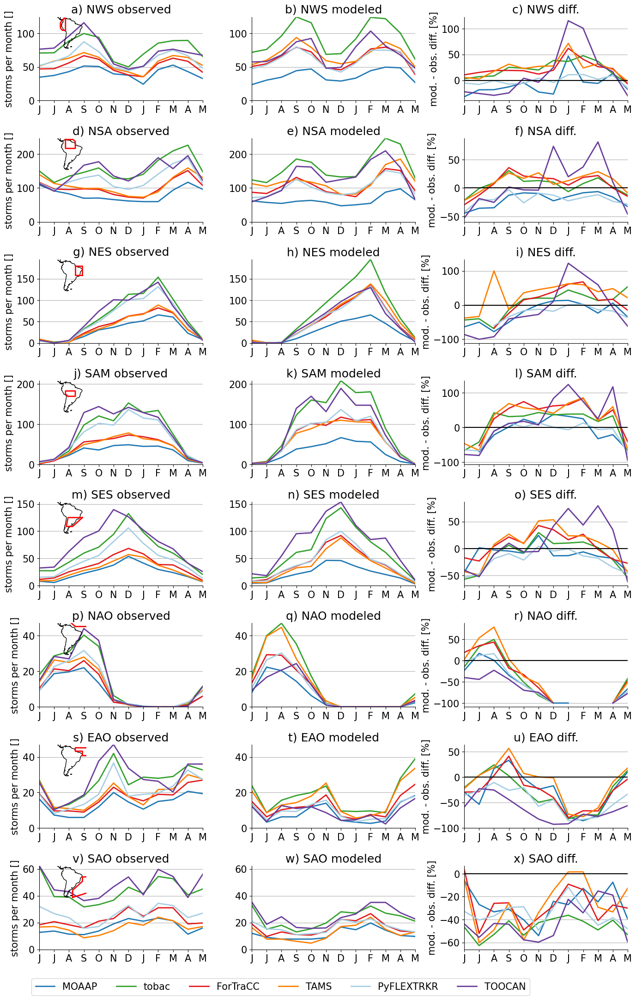

In [10]:
rgrColors=['#000000','#ee2f35','#1f78b4','#ff7f00'] #['#000000','#4459a6','#ee2f35']
rgrColorsAll=np.array([['#737373','#969696','#252525'],
              ['#fb6a4a','#de2d26','#cb181d'],
              ['#fb6a4a','#1f78b4','#cb181d'],
              ['#fb6a4a','#ff7f00','#cb181d']])
rgsRegions = list(grShapeFiles.keys())

mpl.rcParams.update(mpl.rcParamsDefault)
plt.rcParams.update({'font.size': 15})

fig = plt.figure(figsize=(14,24))
# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(8,3) #rgiSize[2])
gs1.update(left=0.06, right=0.97,
           bottom=0.13, top=0.97,
           wspace=0.30, hspace=0.45)

statistics = ['observed', 'modeled', 'diff.']
line_style = ['-','--']
da_label = ['obs','mod']

line_styles = ['solid', 'dashed', 'dashdot', 'dotted', (0, (3, 1, 1, 1)), (0, (1, 1))]

for sr in range(len(SelRegions)): #range(rgiSize[2]):
    rgrShapeAct=np.array(grShapeFiles[rgsRegions[sr]])
    iSR=list(grShapeFiles.keys()).index(rgsRegions[sr])
    for st in range(len(statistics)):
        ax = plt.subplot(gs1[sr,st])

        for tr in range(len(Trackers)):
            if st == 0:
                DATA = np.copy(MCSsPerMonthS4[:,:,sr,tr])
            elif st == 1:
                DATA = np.copy(MCSsPerMonth_mod[:,:,sr,tr])
            elif st == 2:
                DATA = ((np.copy(MCSsPerMonth_mod[:,:,sr,tr]) - np.copy(MCSsPerMonthS4[:,:,sr,tr])) / 
                        np.copy(MCSsPerMonthS4[:,:,sr,tr])) * 100.
            DATA = np.roll(DATA, 6)

            # storm cound
            rgrDataAct= np.nanpercentile(DATA[1::2], (0,50,100), axis=0)
            rgrDataHigh=rgrDataAct[2,:]
            rgrDataLow=rgrDataAct[0,:]
            rgrDataAct=rgrDataAct[1,:]
            xLable=''
            yLable='storms per month []'
            sTitle=SelRegions[sr]

            plt.plot(range(12), np.nanmean(DATA, axis=0), ls='-', color=tr_colors[tr],lw=2, 
                         label=tracker_names[tr])
            if (sr == len(SelRegions)-1) & (st ==0):
                plt.legend(bbox_to_anchor=(3, -0.55), loc='lower right', borderaxespad=0., ncol=6)

        ax.set_xlabel(xLable)
        if st == 0:
            ax.set_ylabel(yLable)
        if st == 2:
            ax.set_ylabel('mod. - obs. diff. [%]')
        ax.set_xlim([0,11])

        if st != 2:
            y_lims = np.nanmax([np.nanmean(MCSsPerMonthS4[:,:,sr,:], axis=0), 
                                np.nanmean(MCSsPerMonth_mod[:,:,sr,:], axis=0)])
            ax.set_ylim([0,y_lims])

        ax.xaxis.set_ticks(range(12))
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_xticklabels(['J','J','A','S','O','N','D','J','F','M','A','M'])
        plt.title(rgsLableABC[sr*3+st]+') '+sTitle+ ' ' + statistics[st])
        if st == 0:
            # inlay showing the subregion
            pos1 = np.array(ax.get_position())
            xSize=pos1[1][0]-pos1[0][0]
            ySize=pos1[1][1]-pos1[0][1]
            proj = ccrs.PlateCarree() #ccrs.Robinson() 
            ax2 = plt.axes([pos1[0][0]+xSize*0,
                          pos1[0][1]+ySize*0.60,
                          xSize*0.4,
                          ySize*0.4,
                          ], projection=proj) #, axisbg='y')

            plt.axis('off')

            ax2.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
            ax2.coastlines()
            ax2.plot(rgrShapeAct[:,0], rgrShapeAct[:,1],c='red', linewidth=2, transform=ccrs.PlateCarree())
            if sr == 0:
                ax2.legend(loc='lower center',
                          ncol=1, frameon=False) #, bbox_to_anchor=(0.5, -0.35)
        if st == 2:
            plt.axhline(y = 0, color = 'k', linestyle = '-')
        ax.grid(axis='y')


# Save the plot
# plt.show()
sPlotFile=sPlotDir
sPlotName= 'MCS_Annual-Cycle_v1.pdf'
if os.path.isdir(sPlotFile) != 1:
    subprocess.call(["mkdir","-p",sPlotFile])
print( '        Plot map to: '+sPlotFile+sPlotName)
fig.savefig(sPlotFile+sPlotName) #, dpi=700)
# fig.savefig(sPlotFile+sPlotName, dpi=700)


### Puplication ready plot

In [11]:
SelRegions_pub = ['NWS','SAM','SES','SAO'] #,'SWS','SSA']
rgsRegions = list(grShapeFiles.keys())

mpl.rcParams.update(mpl.rcParamsDefault)
plt.rcParams.update({'font.size': 15})

fig = plt.figure(figsize=(14,14))
# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(len(SelRegions_pub),3) #rgiSize[2])
gs1.update(left=0.06, right=0.97,
           bottom=0.13, top=0.97,
           wspace=0.30, hspace=0.3)

statistics = ['observed', 'modeled', 'diff.']
line_style = ['-','--']
da_label = ['obs','mod']

line_styles = ['solid', 'dashed', 'dashdot', 'dotted', (0, (3, 1, 1, 1)), (0, (1, 1))]

for sr in range(len(SelRegions_pub)): #range(rgiSize[2]):
    srs = SelRegions.index(SelRegions_pub[sr])
    
    rgrShapeAct=np.array(grShapeFiles[SelRegions_pub[sr]])
    iSR=list(grShapeFiles.keys()).index(SelRegions_pub[sr])
    for st in range(len(statistics)):
        ax = plt.subplot(gs1[sr,st])

        for tr in range(len(Trackers)):
            if st == 0:
                DATA = np.copy(MCSsPerMonthS4[:,:,srs,tr])
            elif st == 1:
                DATA = np.copy(MCSsPerMonth_mod[:,:,srs,tr])
            elif st == 2:
                DATA = ((np.copy(MCSsPerMonth_mod[:,:,srs,tr]) - np.copy(MCSsPerMonthS4[:,:,srs,tr])) / 
                        np.copy(MCSsPerMonthS4[:,:,srs,tr])) * 100.
            DATA = np.roll(DATA, 6, axis=1)

            # storm cound
            rgrDataAct= np.nanpercentile(DATA[1::2], (0,50,100), axis=0)
            rgrDataHigh=rgrDataAct[2,:]
            rgrDataLow=rgrDataAct[0,:]
            rgrDataAct=rgrDataAct[1,:]
            xLable=''
            yLable='storms count [month]'
            sTitle=SelRegions_pub[sr]

            plt.plot(range(12), np.nanmean(DATA, axis=0), ls='-', color=tr_colors[tr],lw=2, 
                         label=tracker_names[tr])
            if (sr == len(SelRegions_pub)-1) & (st ==0):
                plt.legend(bbox_to_anchor=(3, -0.3), loc='lower right', borderaxespad=0., ncol=6)

        ax.set_xlabel(xLable)
        if st == 0:
            ax.set_ylabel(yLable)
        if st == 2:
            ax.set_ylabel('mod. - obs. diff. [%]')
        ax.set_xlim([0,11])

        if st != 2:
            y_lims = np.nanmax([np.nanmean(MCSsPerMonthS4[:,:,srs,:], axis=0), 
                                np.nanmean(MCSsPerMonth_mod[:,:,srs,:], axis=0)])
            ax.set_ylim([0,y_lims])

        ax.xaxis.set_ticks(range(12))
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_xticklabels(['J','J','A','S','O','N','D','J','F','M','A','M'])
        plt.title(rgsLableABC[sr*3+st]+') '+sTitle + ' ' + statistics[st])
        if st == 0:
            # inlay showing the subregion
            pos1 = np.array(ax.get_position())
            xSize=pos1[1][0]-pos1[0][0]
            ySize=pos1[1][1]-pos1[0][1]
            proj = ccrs.PlateCarree() #ccrs.Robinson() 
            ax2 = plt.axes([pos1[0][0]+xSize*0,
                          pos1[0][1]+ySize*0.60,
                          xSize*0.4,
                          ySize*0.4,
                          ], projection=proj) #, axisbg='y')

            plt.axis('off')

            ax2.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
            ax2.coastlines()
            ax2.plot(rgrShapeAct[:,0], rgrShapeAct[:,1],c='red', linewidth=2, transform=ccrs.PlateCarree())
            if sr == 0:
                ax2.legend(loc='lower center',
                          ncol=1, frameon=False) #, bbox_to_anchor=(0.5, -0.35)
        if st == 2:
            plt.axhline(y = 0, color = 'k', linestyle = '-')
        ax.grid(axis='y')


# Save the plot
# plt.show()
sPlotFile=sPlotDir
sPlotName= 'Fig_04_MCS_Annual-Cycle_v1.pdf'
if os.path.isdir(sPlotFile) != 1:
    subprocess.call(["mkdir","-p",sPlotFile])
print( '        Plot map to: '+sPlotFile+sPlotName)
fig.savefig(sPlotFile+sPlotName) #, dpi=700)
# fig.savefig(sPlotFile+sPlotName, dpi=700)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/Fig_04_MCS_Annual-Cycle_v1.pdf


In [12]:
np.nansum(DATA)/3

-508.6786840134864

In [13]:
np.nansum((MCSsPerMonthS4[:,:,srs,:]), axis=(0,1))/3

array([197.33333333, 522.33333333, 274.33333333, 196.33333333,
       314.33333333, 574.        ])

### Plot the dirunal cycle of MCSs

In [14]:
# rgrColors=['#000000','#ee2f35','#1f78b4','#ff7f00'] #['#000000','#4459a6','#ee2f35']
# rgrColorsAll=np.array([['#737373','#969696','#252525'],
#               ['#fb6a4a','#de2d26','#cb181d'],
#               ['#fb6a4a','#1f78b4','#cb181d'],
#               ['#fb6a4a','#ff7f00','#cb181d']])
# rgsRegions = list(grShapeFiles.keys())

# import cartopy.crs as ccrs
# fig = plt.figure(figsize=(18,8))
# # Histogram plots
# rgiSize=MCSsPerMonthS4.shape
# gs1 = gridspec.GridSpec(2,4) #rgiSize[2])
# gs1.update(left=0.06, right=0.97,
#            bottom=0.13, top=0.97,
#            wspace=0.20, hspace=0.5)

# XX = [0,1,2,3,0,1,2,3]
# YY = [0,0,0,0,1,1,1,1]
# for sr in range(len(SelRegions)): #range(rgiSize[2]):
#     rgrShapeAct=np.array(grShapeFiles[rgsRegions[sr]])
#     iSR=list(grShapeFiles.keys()).index(rgsRegions[sr])

#     ax = plt.subplot(gs1[YY[sr],XX[sr]])
#     for da in [0,1]: #range(len(rgsDataSets)):
#         if da == 0:
#             iLineW=4
#             DATA = np.nanmean(MCSsPerHour_MM[:,:,:,sr], axis=(0,1))
#         elif da == 1:
#             iLineW=2
#             DATA = np.nanmean(MCSsPerHour_MM_Mod[:,:,:,sr], axis=(0,1))
        
#         xLable='hours in UTC'
#         yLable='storms per hour []'
#         sTitle=SelRegions[sr]

#         plt.plot(range(24), DATA, ls='-', color=rgrColors[da],lw=2, 
#                  label=rgsDataSets[da])

#     ax.set_xlabel(xLable)
#     if sr == 0:
#         ax.set_ylabel(yLable)
#     ax.set_xlim([0,23])
#     plt.xticks(rotation = 90)
#     ax.xaxis.set_ticks(range(0,24,2))
#     plt.title(rgsLableABC[sr]+') '+sTitle)
# #     ax.set_ylim([0,np.max(DATA)*1.35])
    
#     if sr == 0:
#         ax.legend(loc='lower center',
#                   ncol=1, frameon=False)


#     # inlay showing the subregion
#     pos1 = np.array(ax.get_position())
#     xSize=pos1[1][0]-pos1[0][0]
#     ySize=pos1[1][1]-pos1[0][1]
#     proj = ccrs.PlateCarree() #ccrs.Robinson() 
#     ax = plt.axes([pos1[0][0]+xSize*0,
#                   pos1[0][1]+ySize*0.60,
#                   xSize*0.4,
#                   ySize*0.4,
#                   ], projection=proj) #, axisbg='y')

#     plt.axis('off')
#     ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
#     ax.coastlines()
    
#     ax.plot(rgrShapeAct[:,0], rgrShapeAct[:,1],c='red', linewidth=2, transform=ccrs.PlateCarree(), label=rgsDataSets[da])
    
# # Save the plot
# # plt.show()
# sPlotFile=sPlotDir
# sPlotName= 'StormDiurnalCycle_Characteristics_5mm_Sigma3_3000GC.pdf'
# if os.path.isdir(sPlotFile) != 1:
#     subprocess.call(["mkdir","-p",sPlotFile])
# print( '        Plot map to: '+sPlotFile+sPlotName)
# fig.savefig(sPlotFile+sPlotName) #, dpi=700)
# # fig.savefig(sPlotFile+sPlotName, dpi=700)


### Print MCS characteridtics

In [15]:
mcs_regional_stats = {}

for re in tqdm(range(len(SelRegions))):
    REG=SelRegions[re]
    reg_stats={}

    # ["Amazon Basin",'LaPlata_fin','Columbia_fin']

    SizeRegS4=np.zeros((100000,2000, len(Trackers))); SizeRegS4[:]=np.nan
    SpeedS4=np.copy(SizeRegS4)
    MAXS4 = np.copy(SizeRegS4)
    P95S4 = np.copy(SizeRegS4)
    MEANS4 = np.copy(SizeRegS4)
    VOLS4 = np.copy(SizeRegS4)

    SizeReg_mod=np.zeros((100000,1000, len(Trackers))); SizeReg_mod[:]=np.nan
    Speed_mod = np.copy(SizeReg_mod)
    MAX_mod = np.copy(SizeReg_mod)
    P95_mod = np.copy(SizeReg_mod)
    MEAN_mod = np.copy(SizeReg_mod)
    VOL_mod = np.copy(SizeReg_mod)


    for tr in range(len(Trackers)):

        # Process Stage IV
        MCSs=np.array(list(size_all[Trackers[tr]].keys()))
        SelReg=[REG in MCSs[ii] for ii in range(len(MCSs))]
        MCSReg=MCSs[SelReg]

        for mc in range(len(MCSReg)):
            SizeAct=size_all[Trackers[tr]][MCSReg[mc]]
            SizeRegS4[mc,:len(SizeAct),tr]=SizeAct
            SpeedAct=speed_all[Trackers[tr]][MCSReg[mc]]
            SpeedS4[mc,:len(SpeedAct),tr]=SpeedAct
            MAXact = pr_max_all[Trackers[tr]][MCSReg[mc]]
            MAXS4[mc,:len(MAXact),tr]=MAXact
            P95act = pr_P95_all[Trackers[tr]][MCSReg[mc]]
            P95S4[mc,:len(P95act),tr]=P95act
            MEANact = pr_mean_all[Trackers[tr]][MCSReg[mc]]
            MEANS4[mc,:len(MEANact),tr]=MEANact
            VOLact=pr_vol_all[Trackers[tr]][MCSReg[mc]]
            VOLS4[mc,:len(VOLact),tr]=VOLact/1000000.

        # Process CONUS404
        MCSs=np.array(list(size_all_mod[Trackers[tr]].keys()))
        print(len(MCSs))
        SelReg=[REG in MCSs[ii] for ii in range(len(MCSs))]
        MCSReg=MCSs[SelReg]

        for mc in range(len(MCSReg)):
            SizeAct=size_all_mod[Trackers[tr]][MCSReg[mc]]
            SpeedAct=speed_all_mod[Trackers[tr]][MCSReg[mc]]
            MAXAct = pr_max_all_mod[Trackers[tr]][MCSReg[mc]]
            P95Act = pr_P95_all_mod[Trackers[tr]][MCSReg[mc]]
            MEANAct = pr_mean_all_mod[Trackers[tr]][MCSReg[mc]]
            VOLact = pr_vol_all_mod[Trackers[tr]][MCSReg[mc]]
            try:
                SizeReg_mod[mc,:,tr]=SizeAct[:SizeReg_mod.shape[1]]
                Speed_mod[mc,:,tr]=SpeedAct[:Speed_mod.shape[1]]
                MAX_mod[mc,:,tr]=MAXAct[:MAX_mod.shape[1]]
                P95_mod[mc,:,tr]=P95Act[:MAX_mod.shape[1]]
                MEAN_mod[mc,:,tr]=MEANAct[:MEAN_mod.shape[1]]
                VOL_mod[mc,:,tr]=VOLact[:VOL_mod.shape[1]]/1000000.
            except:
        #     max_len = np.min([len(SizeAct),SizeReg_mod.shape[1]])-1
        #     SizeReg_mod[mc,:max_len]=SizeAct[:max_len]
        #     Speed_mod[mc,:max_len]=SpeedAct[:max_len]
        #     MAX_mod[mc,:max_len]=MAXAct[:max_len]
        #     MEAN_mod[mc,:max_len]=MEANAct[:max_len]
        #     VOL_mod[mc,:max_len]=VOLact[:max_len]
                try:
                    SizeReg_mod[mc,:len(SizeAct),tr]=SizeAct[:]
                    Speed_mod[mc,:len(SpeedAct),tr]=SpeedAct
                    MAX_mod[mc,:len(MAXAct),tr]=MAXAct
                    P95_mod[mc,:len(P95Act),tr]=P95Act
                    MEAN_mod[mc,:len(MEANAct),tr]=MEANAct
                    VOL_mod[mc,:len(VOLact),tr]=VOLact/1000000.
                except:
                    continue

    # SIZE_S4=SizeRegS4[~np.isnan(SizeRegS4)]
    # SPEED_S4=SpeedS4[~np.isnan(SpeedS4)]
    # MAX_S4 = MAXS4[~np.isnan(MAXS4)]
    # MEAN_S4 = MEANS4[~np.isnan(MEANS4)]
    # VOL_S4 = VOLS4[~np.isnan(VOLS4)]#/(1000*1000*1000)
    Duration_S4 = np.array([[np.sum(~np.isnan(MEANS4[ii,:,tr])) for ii in range(VOLS4.shape[0])] for tr in range(len(Trackers))])
    Duration_S4 = Duration_S4.astype('float')
    Duration_S4[Duration_S4 == 0] = np.nan  
    VOLS4[VOLS4 == 0] = np.nan  

    # SIZE_mod = SizeReg_mod[~np.isnan(SizeReg_mod)]
    # SPEED_mod = Speed_mod[~np.isnan(Speed_mod)]
    # MAX_mod = MAX_mod[~np.isnan(MAX_mod)]
    # MEAN_mod = MEAN_mod[~np.isnan(MEAN_mod)]
    # VOL_mod = VOL_mod[~np.isnan(VOL_mod)] #/(1000*1000*1000)
    Duration_mod = np.array([[np.sum(~np.isnan(MEAN_mod[ii,:,tr])) for ii in range(VOL_mod.shape[0])] for tr in range(len(Trackers))])
    Duration_mod = Duration_mod.astype('float')
    Duration_mod[Duration_mod == 0] = np.nan  
    # Duration_mod = np.array([np.sum(~np.isnan(MEAN_mod[ii,:])) for ii in range(VOL_mod.shape[0])])
    VOL_mod[VOL_mod == 0] = np.nan  
    
    reg_stats['Duration_S4'] = Duration_S4
    reg_stats['Duration_mod'] = Duration_mod
    reg_stats['VOLS4'] = VOLS4
    reg_stats['VOL_mod'] = VOL_mod
    reg_stats['SizeRegS4'] = SizeRegS4
    reg_stats['SizeReg_mod'] = SizeReg_mod
    reg_stats['SpeedS4'] = SpeedS4
    reg_stats['Speed_mod'] = Speed_mod
    reg_stats['MAXS4'] = MAXS4
    reg_stats['MAX_mod'] = MAX_mod
    reg_stats['P95S4'] = P95S4
    reg_stats['P95_mod'] = P95_mod
    reg_stats['MEANS4'] = MEANS4
    reg_stats['MEAN_mod'] = MEAN_mod
    
    mcs_regional_stats[SelRegions[re]] = reg_stats

  0%|          | 0/8 [00:00<?, ?it/s]

7408
19547
12789
13494
12597
16332


 12%|█▎        | 1/8 [03:07<21:54, 187.74s/it]

7408
19547
12789
13494
12597
16332


 25%|██▌       | 2/8 [07:48<24:13, 242.24s/it]

7408
19547
12789
13494
12597
16332


 38%|███▊      | 3/8 [11:42<19:52, 238.56s/it]

7408
19547
12789
13494
12597
16332


 50%|█████     | 4/8 [15:22<15:25, 231.49s/it]

7408
19547
12789
13494
12597
16332


 62%|██████▎   | 5/8 [17:51<10:04, 201.62s/it]

7408
19547
12789
13494
12597
16332


 75%|███████▌  | 6/8 [21:41<07:02, 211.20s/it]

7408
19547
12789
13494
12597
16332


 88%|████████▊ | 7/8 [24:49<03:23, 203.79s/it]

7408
19547
12789
13494
12597
16332


100%|██████████| 8/8 [28:14<00:00, 211.78s/it]


In [16]:
plt.plot(reg_stats['SizeRegS4'][3,:,0])

In [17]:
max_size = np.nanmax(reg_stats['SizeRegS4'][:,:1000,:], axis=1)

In [18]:
reg_stats['SizeRegS4'].shape

(100000, 2000, 6)

In [19]:
max_size.shape

(100000, 6)

In [20]:
np.nanmin(max_size, axis=0)

array([4.51191561e+10, 3.02674039e+10, 4.51191561e+10, 3.93026676e+10,
       8.46324743e+09, 2.20533775e+09])

In [21]:
stats =[
    ['SizeRegS4','SizeReg_mod'],
    ['SpeedS4','Speed_mod'],
    ['P95S4','P95_mod'],
    ['MEANS4','MEAN_mod'],
    ['VOLS4','VOL_mod'],
    ['Duration_S4','Duration_mod']
    ]
statname = ['size [km$^2$]',
            'speed [km h$^{-1}$]',
            'P95 precipitation [mm h$^{-1}$]',
            'mean precipitation [mm h$^{-1}$]',
            'precipitation volume [km$^3$]',
            'duration [h]']

In [22]:
for sr in [1]: #range(len(SelRegions)): #range(rgiSize[2]):
    print('work on '+SelRegions[sr])
    
    fig = plt.figure(figsize=(18,12))
    plt.rcParams.update({'font.size': 15})
    import seaborn as sns
    sns.set(font_scale=1.2, rc={'axes.facecolor':'white'})
    sns.set_style("whitegrid")
    sns.set_style('ticks')
    
    # Histogram plots
    rgiSize=MCSsPerMonthS4.shape
    gs1 = gridspec.GridSpec(2,3) #rgiSize[2])
    gs1.update(left=0.06, right=0.97,
               bottom=0.13, top=0.97,
               wspace=0.2, hspace=0.30)

    REG = SelRegions[sr] #'SES'
    XX = [0,1,2,0,1,2]
    YY = [0,0,0,1,1,1]
    for st in [0,1,2,3,4,5]:
        ax = plt.subplot(gs1[YY[st],XX[st]])
        reg_stats = mcs_regional_stats[REG]
        
        if statname[st] != 'duration [h]':
            if statname[st] == 'speed [km h$^{-1}$]':
                obs_stat = np.nanmedian(reg_stats[stats[st][0]][::10,:], axis=1)
                mod_stat = np.nanmedian(reg_stats[stats[st][1]][::10,:], axis=1)
            elif (statname[st] == 'P95 precipitation [mm h$^{-1}$]') | \
                 (statname[st] == 'size [km$^2$]'):
                obs_stat = np.nanmax(reg_stats[stats[st][0]][:,:], axis=1)
                mod_stat = np.nanmax(reg_stats[stats[st][1]][:,:], axis=1)
            else:
                obs_stat = np.nanmean(reg_stats[stats[st][0]][::10,:], axis=1)
                mod_stat = np.nanmean(reg_stats[stats[st][1]][::10,:], axis=1)
        else:
            obs_stat = reg_stats[stats[st][0]].T
            mod_stat = reg_stats[stats[st][1]].T

        # calculate median over MCSs
        if (statname[st] == 'size [km$^2$]'):
            obs_stat = obs_stat
            obs_stat[:] = obs_stat[:]/(1000**2)
            mod_stat[:] = mod_stat[:]/(1000**2)
            # mod_stat = mod_stat
            # # reset size for tobac
            # obs_stat[:,1] = obs_stat[:,1]*1000**2
            # mod_stat[:,1] = mod_stat[:,1]*1000**2
            
        all_stat = np.append(obs_stat.T.flatten(), mod_stat.T.flatten())
        data_source = np.append(['obs']*len(obs_stat.flatten()), ['mod']*len(obs_stat.flatten()))
        tracker = np.concatenate([[tracker_names[tr]] * obs_stat.shape[0] for tr in range(len(tracker_names))])
        tracker = np.append(tracker,tracker)
        
        mcs_stats_tr = {'max_size':  all_stat,
                        'data source' : data_source,
                        'max_size_tracker' : tracker}

        mcs_stats_tr = pd.DataFrame(mcs_stats_tr)
        mcs_stats_tr['max_size_tracker'] = mcs_stats_tr['max_size_tracker'].astype('category')
        mcs_stats_tr['data source'] = mcs_stats_tr['data source'].astype('category')

        sns.boxplot(x="max_size_tracker", 
                       y="max_size", 
                       hue="data source", 
                       data=mcs_stats_tr, 
                       palette=['#fb9a99','#d9d9d9'], 
                       width=0.4,
                       boxprops={'zorder': 2}, ax=ax,
                       showfliers = False)
        if st != 0:
            plt.legend([],[], frameon=False)

        for _,s in ax.spines.items():
            s.set_linewidth(1)
            s.set_color('k')

        # sns.set(rc={'axes.facecolor':'white'})
        if (statname[st] == 'size [km$^2$]') | (statname[st] == 'precipitation volume [km$^3$]'):
            ylim = ax.get_ylim()
            xlim = ax.get_xlim()
            ax.set_yscale('log')
            ax.set_ylim([np.min([ylim[0],xlim[0]]), np.max(np.max([ylim[1],xlim[1]]))])

        # ax.set_ylim((10000,10**6.5))
        if statname[st] == 'size [km$^2$]':
            plt.axhline(y = 40000, color = 'k', linestyle = '-')
            ax.text(-0.4,40000, 'min. size 40,000 km$^{2}$', ha = 'left', va = 'top', fontsize = 12)
            ax.set_ylim((10000,10**6.5))
            # ax.set_ylim((30,10**6.5))
        if statname[st] == 'precipitation volume [km$^3$]':
            # ax.set_ylim((2000,10**7))
            ax.set_ylim((2000,10**6))
        if statname[st] == 'duration [h]':
            plt.axhline(y = 4, color = 'k', linestyle = '-')
            ax.text(-0.4,4, 'min. duration 4 hours', ha = 'left', va = 'top', fontsize = 12)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel(statname[st])
        ax.set_title(rgsLableABC[st]+') ' + statname[st] + ' ' + SelRegions[sr])
        plt.xticks(rotation=45, ha='center')

        # ax.set_xticklabels(tracker_names,rotation = 45, ha="right")

        # Set the minor tick locations on the y-axis
        ax.yaxis.set_minor_locator(plt.LogLocator(base=10.0, subs=np.arange(0.1, 1.0, 0.1)))

    # Save the plot
    # plt.show()
    sPlotFile=sPlotDir
    sPlotName= 'Fig_05_' + SelRegions[sr] + '_MCS_characteristics.pdf'
    if os.path.isdir(sPlotFile) != 1:
        subprocess.call(["mkdir","-p",sPlotFile])
    print( '        Plot map to: '+sPlotFile+sPlotName)
    fig.savefig(sPlotFile+sPlotName) #, dpi=700)
    # fig.savefig(sPlotFile+sPlotName, dpi=700)
    


work on NSA
        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/Fig_05_NSA_MCS_characteristics.pdf


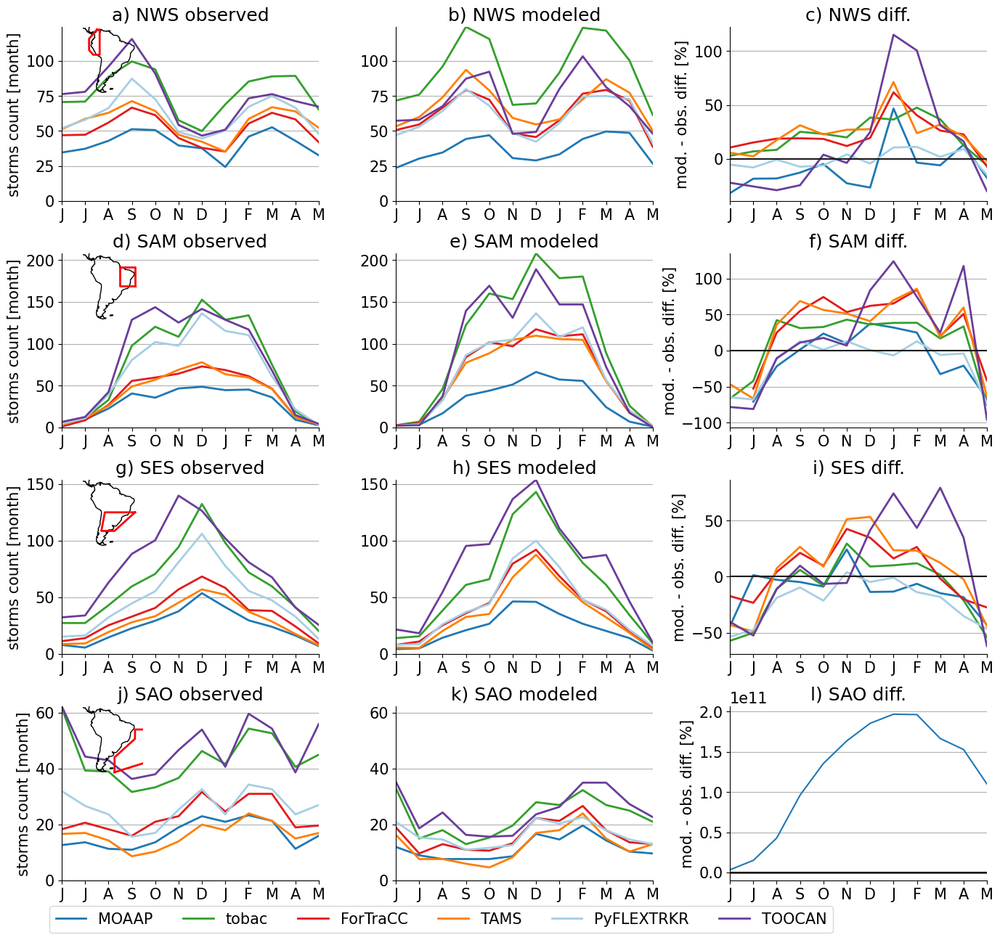

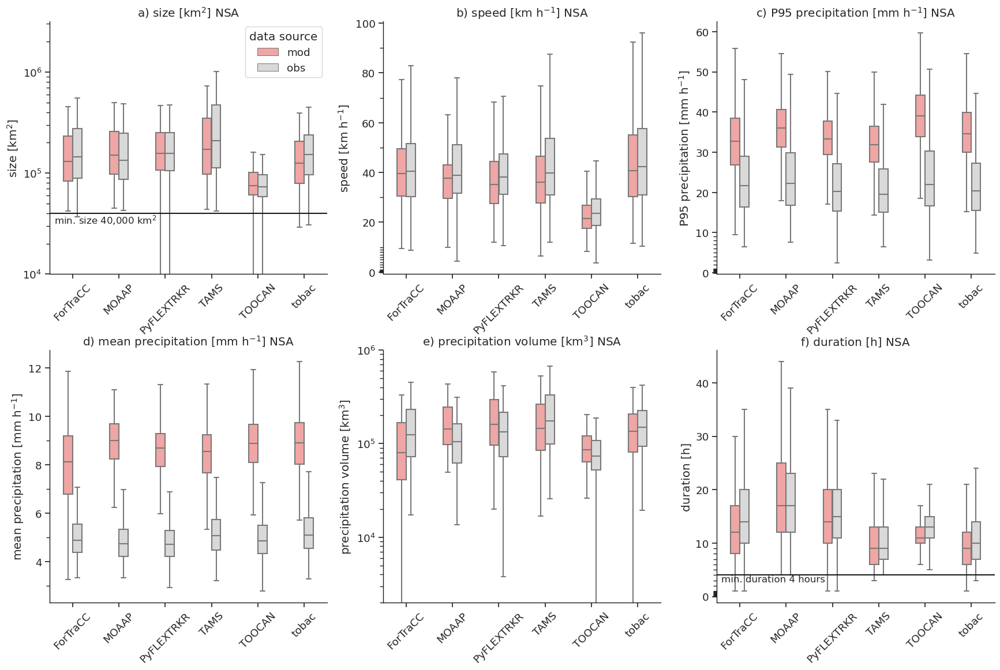

In [23]:
plt.show()

### Plot MCS overview plot

In [24]:
fig = plt.figure(figsize=(15,9.5))
plt.rcParams.update({'font.size': 15})
import matplotlib.ticker as ticker
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(2,3) #rgiSize[2])
gs1.update(left=0.06, right=0.97,
           bottom=0.13, top=0.97,
           wspace=0.3, hspace=0.30)

# --------------------------------
# Plot Size Distribution

XX = [0,1,2,0,1,2]
YY = [0,0,0,1,1,1]

for st in tqdm(range(len(statname))):
    ax = plt.subplot(gs1[YY[st],XX[st]])
    tracker_color = ['#1f78b4','#33a02c','#e31a1c','#ff7f00','#a6cee3','#b2df8a','#fb9a99']
    reg_symb = ["o","v",">","<","s","P","X","D","*","1"]

    scatter_for_hull = np.zeros((len(SelRegions), len(Trackers),2))
    # obs_stat = np.copy(mod_stat)

    for re in range(len(SelRegions)):
        REG = SelRegions[re]
        reg_stats = mcs_regional_stats[REG]
        if statname[st] == 'speed [km h$^{-1}$]':
            obs_stat = np.nanmedian(reg_stats[stats[st][0]][::10,:], axis=1)
            mod_stat = np.nanmedian(reg_stats[stats[st][1]][::10,:], axis=1)
        elif (statname[st] == 'P95 precipitation [mm h$^{-1}$]') | \
             (statname[st] == 'size [km$^2$]'):
            obs_stat = np.nanmax(reg_stats[stats[st][0]][::10,:], axis=1)
            mod_stat = np.nanmax(reg_stats[stats[st][1]][::10,:], axis=1)
        elif (statname[st] == 'duration [h]'):
            obs_stat = np.nanmean(reg_stats[stats[st][0]][:,:], axis=1)
            mod_stat = np.nanmean(reg_stats[stats[st][1]][:,:], axis=1)
        else:
            obs_stat = np.nanmean(reg_stats[stats[st][0]][::10,:], axis=1)
            mod_stat = np.nanmean(reg_stats[stats[st][1]][::10,:], axis=1)
            
        # calculate median over MCSs
        if (statname[st] != 'duration [h]'):
            obs_stat = np.nanmedian(obs_stat, axis=0)
            mod_stat = np.nanmedian(mod_stat, axis=0)
        if (statname[st] == 'size [km$^2$]'):
            obs_stat = obs_stat/1000**2
            mod_stat = mod_stat/1000**2
        
        scatter_for_hull[re, :,0] = obs_stat
        scatter_for_hull[re, :,1] = mod_stat
        for tr in range(len(Trackers)):
            plt.scatter(obs_stat[tr], mod_stat[tr], c = tr_colors[tr], marker=reg_symb[re])
        
    # plot convex hull arround data points from each tracker
    for tr in range(len(Trackers)):
        points = scatter_for_hull[:,tr,:]
        hull = ConvexHull(points)
        for simplex in hull.simplices:
            plt.plot(points[simplex, 0], points[simplex, 1], tr_colors[tr], lw=0.5, ls='--')

    ylim = ax.get_ylim()
    xlim = ax.get_xlim()
    ax.set_ylim([np.min([ylim[0],xlim[0]]), np.max(np.max([ylim[1],xlim[1]]))])
    ax.set_xlim([np.min([ylim[0],xlim[0]]), np.max(np.max([ylim[1],xlim[1]]))])
    if (statname[st] == 'size [km$^2$]') | (statname[st] == 'precipitation volume [km$^3$]'):
        ax.set_yscale('log')
        ax.set_xscale('log')
        ax.set_ylim([np.min([ylim[0],xlim[0]]), np.max(np.max([ylim[1],xlim[1]]))])
        ax.set_xlim([np.min([ylim[0],xlim[0]]), np.max(np.max([ylim[1],xlim[1]]))])
        
        # set the minor tick locator
        ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(2, 10)))
        # set the minor tick labels format
        def minor_tick_formatter(x, pos):
            power = np.floor(np.log10(x))
            base = int(x / 10 ** power)
            return f"{base}x10$^{{{power:.0f}}}$"
        minor_formatter = ticker.FuncFormatter(minor_tick_formatter)
        ax.xaxis.set_minor_formatter(minor_formatter)
        ax.tick_params(axis='x', which='both', labelrotation=90)

        # set the minor tick locator
        ax.yaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(2, 10)))
        # set the minor tick labels format
        def minor_tick_formatter(y, pos):
            power = np.floor(np.log10(y))
            base = int(y / 10 ** power)
            return f"{base}x10$^{{{power:.0f}}}$"
        minor_formatter = ticker.FuncFormatter(minor_tick_formatter)
        ax.yaxis.set_minor_formatter(minor_formatter)
        
        
    
    ax.plot([0, 1], [0, 1], transform=ax.transAxes, c='k', lw=0.5)
#     if (statname[st] == 'size [km$^2$]') | (statname[st] == 'precipitation volume [km$^3$]'):
        
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['left'].set_color('k')
    ax.spines['bottom'].set_color('k')
    ax.set_xlabel('obs. '+statname[st])
    ax.set_ylabel('mod. '+statname[st])
    ax.set_title(rgsLableABC[st]+') '+statname[st])
    ax.xaxis.set_minor_locator(ticker.LogLocator(base=10.0, subs=np.arange(2, 10)))
    
    
    if st == 0:
        for re in range(len(SelRegions)):
            plt.plot([],[], marker = reg_symb[re], label = SelRegions[re], lw=0, color='k')
        plt.legend()
    if st == 1:
        for tr in range(len(Trackers)):
            plt.plot([],[], label = tracker_names[tr], color=tr_colors[tr])
        plt.legend()

        
# Save the plot
# plt.show()
sPlotFile=sPlotDir
sPlotName= 'Fig_06_mean-MCS_characteristics.pdf'
if os.path.isdir(sPlotFile) != 1:
    subprocess.call(["mkdir","-p",sPlotFile])
print( '        Plot map to: '+sPlotFile+sPlotName)
fig.savefig(sPlotFile+sPlotName) #, dpi=700)
# fig.savefig(sPlotFile+sPlotName, dpi=700)

100%|██████████| 6/6 [14:28<00:00, 144.73s/it]


        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/Fig_06_mean-MCS_characteristics.pdf


### MCS origin and track on maps

In [25]:
# fig = plt.figure(figsize=(16,14))
# import seaborn as sns

# # Histogram plots
# rgiSize=MCSsPerMonthS4.shape
# gs1 = gridspec.GridSpec(1,2) #rgiSize[2])
# gs1.update(left=0.06, right=0.97,
#            bottom=0.13, top=0.97,
#            wspace=0.0, hspace=0.40)

# # --------------------------------
# # Plot the MCS Origin in Stage IV and CONUS404

# proj = ccrs.PlateCarree() #ccrs.Robinson() 

# ax = plt.subplot(gs1[0,0], projection=proj)
# plt.axis('off')
# ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
# ax.coastlines()

# # plot OBS Origin
# sS4_MCSs=list(StormLatS4All.keys())
# for mc in range(len(sS4_MCSs)):
#     try:
#         ax.plot(StormLonS4All[sS4_MCSs[mc]][0], StormLatS4All[sS4_MCSs[mc]][0],'ko', markersize=3, alpha=0.5, transform=ccrs.PlateCarree())
#     except:
#         continue

# # plot CONUS404 Origin
# sC404_MCSs=list(StormLon_modAll.keys())
# for mc in range(len(sC404_MCSs)):
#     try:
#         ax.plot(StormLon_modAll[sC404_MCSs[mc]][0], StormLat_modAll[sC404_MCSs[mc]][0],'ro', markersize=3, alpha=0.5, transform=ccrs.PlateCarree())
#     except:
#         continue

    
# # ==================================
# # Plot the MCS Tracks in Stage IV and CONUS404
# ax = plt.subplot(gs1[0,1], projection=proj)
# plt.axis('off')
# ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
# ax.coastlines()

# # plot OBS Origin
# sS4_MCSs=list(StormLatS4All.keys())
# for mc in range(len(sS4_MCSs)):
#     ax.plot(StormLonS4All[sS4_MCSs[mc]], StormLatS4All[sS4_MCSs[mc]],'k', markersize=4, alpha=0.25, lw=0.5, transform=ccrs.PlateCarree())

# # plot CONUS404 Origin
# sC404_MCSs=list(StormLat_modAll.keys())
# for mc in range(len(sC404_MCSs)):
#     plt.plot(StormLon_modAll[sC404_MCSs[mc]], StormLat_modAll[sC404_MCSs[mc]],'r', markersize=4, alpha=0.25, lw=0.5, transform=ccrs.PlateCarree())
    

# # Save the plot
# # plt.show()
# sPlotFile=sPlotDir
# sPlotName= str(TimeMM.year[0])+'-'+str(TimeMM.year[-1])+'_MCS-Origin-Track_5mm_Sigma3_3000GC.pdf'
# if os.path.isdir(sPlotFile) != 1:
#     subprocess.call(["mkdir","-p",sPlotFile])
# print( '        Plot map to: '+sPlotFile+sPlotName)
# fig.savefig(sPlotFile+sPlotName) #, dpi=700)
# # fig.savefig(sPlotFile+sPlotName, dpi=700)


In [26]:
### read orography from SAAG 
import xarray as xr
ds_disk = xr.open_dataset('/glade/campaign/univ/uiuc0017/chliu/WRF4KM_2000-2020/wrf2d_wrf3d/wrfconstants_SAAG_20yr.nc')
LonE=np.squeeze(np.array(ds_disk['XLONG']))
LatE=np.squeeze(np.array(ds_disk['XLAT']))
LANDMASK=np.squeeze(np.array(ds_disk['LANDMASK']))
HGT = np.squeeze(np.array(ds_disk['HGT']))

        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/2010-2019_MCS-initiation_frequcney.pdf


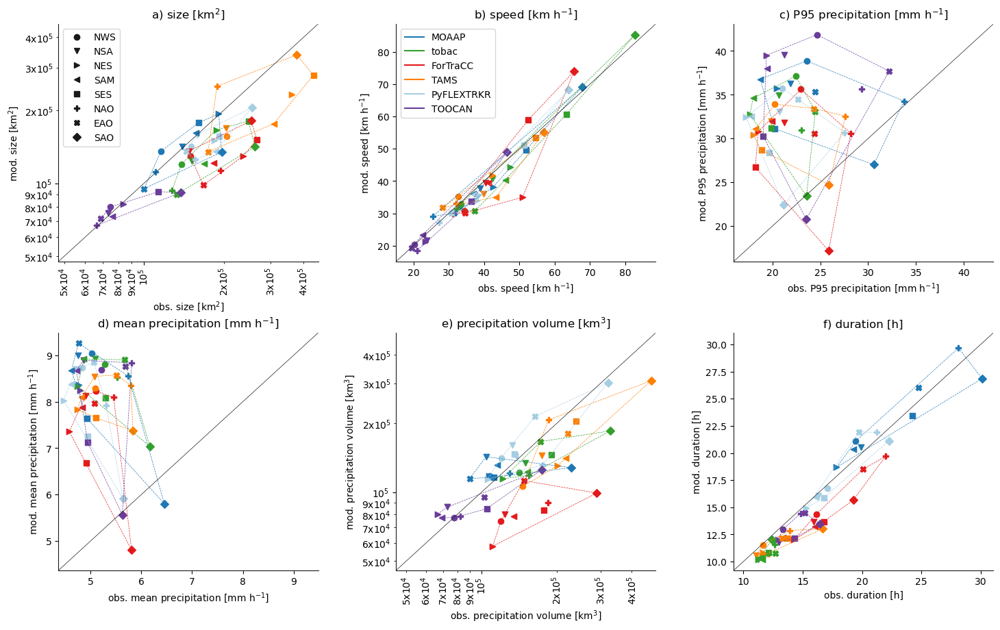

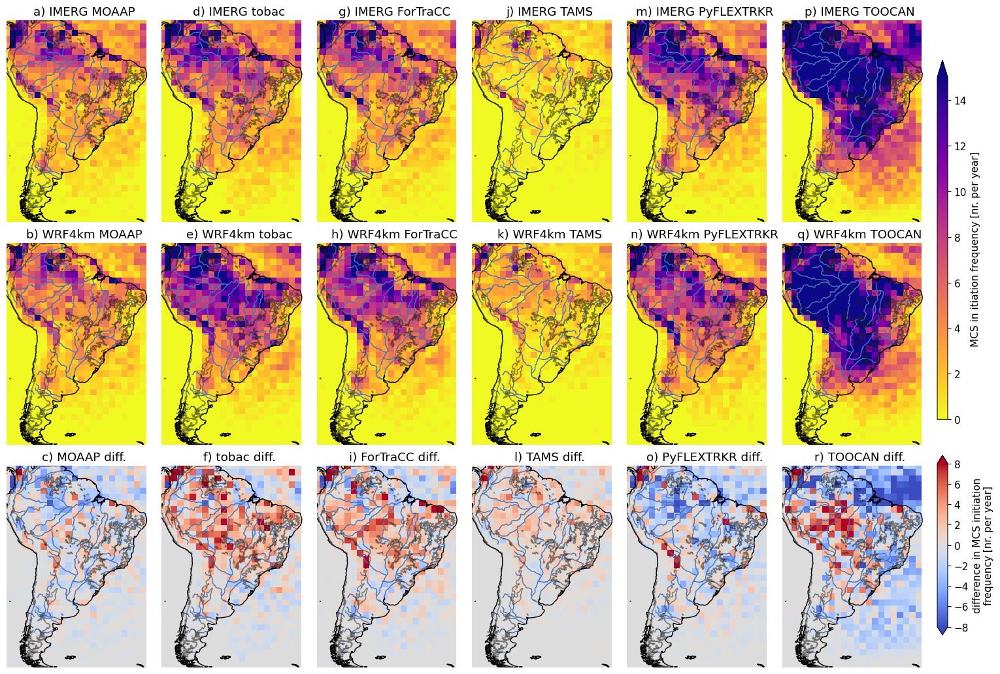

In [27]:
from scipy.ndimage import gaussian_filter
import matplotlib.gridspec as gridspec
# from mpl_toolkits.basemap import Basemap, cm
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
from pylab import *
import string
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import shapefile

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import shapely.geometry as sgeom
from matplotlib.colors import LogNorm

import seaborn as sns
from scipy.stats import kde
import cartopy.feature as cfeature
rivers_50m = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', '50m')

fig = plt.figure(figsize=(16,11))
import seaborn as sns
plt.rcParams.update({'font.size': 11})

# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(3,len(Trackers)) #rgiSize[2])
gs1.update(left=0.06, right=0.95,
           bottom=0.04, top=0.97,
           wspace=0.0, hspace=0.0)

heatmaps_initiation = np.zeros((33,23,len(Trackers), len(rgsDataSets))); heatmaps_initiation[:] = np.nan

for tr in range(len(Trackers)):
    # --------------------------------
    # Plot the MCS Origin in Stage IV and CONUS404
    proj = ccrs.PlateCarree() #ccrs.Robinson() 

    for da in range(len(rgsDataSets)):
        ax = plt.subplot(gs1[da,tr], projection=proj)
        plt.axis('off')
        ax.set_extent((-80, -30, -55, 10), ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

        if rgsDataSets[da] == 'IMERG':
            DATA_LAT = lat_all[Trackers[tr]]
            DATA_LON = lon_all[Trackers[tr]]
            DATA_SIZE = size_all[Trackers[tr]]
        else:
            DATA_LAT = lat_all_mod[Trackers[tr]]
            DATA_LON = lon_all_mod[Trackers[tr]]
            DATA_SIZE = size_all_mod[Trackers[tr]]

        # plot OBS Origin
        sS4_MCSs=list(DATA_LAT.keys())

        xx = np.zeros((len(list(DATA_LAT.keys())))); xx[:] = np.nan
        yy = np.copy(xx)
        
        bins = [np.arange(int(Lat.min()), int(Lat.max()),2),
                np.arange(int(Lon.min()), int(Lon.max()),2)]
        
        for mc in range(len(list(DATA_LAT.keys()))):
            if DATA_SIZE[sS4_MCSs[mc]][0] < 40000 * 10**6:
                xx[mc] = DATA_LAT[sS4_MCSs[mc]][0]
                yy[mc] = DATA_LON[sS4_MCSs[mc]][0]
        # x = np.array([DATA_LAT[sS4_MCSs[mc]][0] for mc in range(len(list(DATA_LAT.keys())))])
        # y = np.array([DATA_LON[sS4_MCSs[mc]][0] for mc in range(len(list(DATA_LON.keys())))])

        xx = xx[~np.isnan(xx)]
        yy = yy[~np.isnan(yy)]
        
        heatmap, xedges, yedges = np.histogram2d(xx, yy, bins=bins)
        extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
        heatmap = heatmap/3 # initiations per year
        
        heatmaps_initiation[:,:,tr,da] = heatmap
        if da == 0:
            heatmap_obs = np.copy(heatmap)
        if da == 1:
            heatmap_mod = np.copy(heatmap)

        xx = xedges #(xedges[1:]+xedges[:-1])/2
        yy = yedges #(yedges[1:]+yedges[:-1])/2
        xx, yy = np.meshgrid(xx,yy)
        cs = plt.pcolormesh(yy,
                           xx,
                           heatmap.T,
                           transform=ccrs.PlateCarree(),
                           cmap = 'plasma_r',
                           vmin = 0,
                           vmax = 15)

        ax.set_title(rgsLableABC[da+tr*3]+') ' + rgsDataSets[da] + ' ' + tracker_names[tr])
        plt.contour(LonE,LatE,HGT, ccrs.PlateCarree(), levels=[500],linewidths=1, colors='k', alpha=0.5)
        
    ### ADD PLOT SHOWING DIFFERENCES
    ax = plt.subplot(gs1[2,tr], projection=proj)
    plt.axis('off')
    ax.set_extent((-80, -30, -55, 10), ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

    if rgsDataSets[da] == 'IMERG':
        DATA_LAT = lat_all[Trackers[tr]]
        DATA_LON = lon_all[Trackers[tr]]
    else:
        DATA_LAT = lat_all_mod[Trackers[tr]]
        DATA_LON = lon_all_mod[Trackers[tr]]

    heatmap = heatmap_mod - heatmap_obs

    xx = xedges # (xedges[1:]+xedges[:-1])/2
    yy = yedges # (yedges[1:]+yedges[:-1])/2
    xx, yy = np.meshgrid(xx,yy)
    cs_b = plt.pcolormesh(yy,
                       xx,
                       heatmap.T,
                       transform=ccrs.PlateCarree(),
                       cmap = 'coolwarm',
                       vmin = -8,
                       vmax = 8)

    ax.set_title(rgsLableABC[2+tr*3]+') ' + tracker_names[tr] + ' diff.')
    plt.contour(LonE,LatE,HGT, ccrs.PlateCarree(), levels=[500],linewidths=1, colors='k', alpha=0.5)

CbarAx = axes([0.95, 0.4, 0.01, 0.5])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='max')#, ticks=np.linspace(0,0.0015,41))
# cb.ax.set_xticklabels(LEVS,rotation=90)
cb.set_label('MCS in itiation frequency [nr. per year]') #, fontsize=12)

CbarAx = axes([0.95, 0.1, 0.01, 0.25])
cb = colorbar(cs_b, cax = CbarAx, orientation='vertical', extend='both')#, ticks=np.linspace(0,0.0015,41))
# cb.ax.set_xticklabels(LEVS,rotation=90)
cb.set_label('difference in MCS initiation\nfrequency [nr. per year]') #, fontsize=12)
    
sPlotFile=sPlotDir
sPlotName= str(TimeMM.year[0])+'-'+str(TimeMM.year[-1])+'_MCS-initiation_frequcney.pdf'
if os.path.isdir(sPlotFile) != 1:
    subprocess.call(["mkdir","-p",sPlotFile])
fig.savefig(sPlotFile+sPlotName, bbox_inches='tight') #, dpi=700)
print( '        Plot map to: '+sPlotFile+sPlotName)
plt.show()

### Temporal evolution of MCSs

In [28]:
# speed_all[Trackers[tr]] = StormSpeedS4
# lat_all[Trackers[tr]] = StormLatS4
# lon_all[Trackers[tr]] = StormLonS4
# size_all[Trackers[tr]] = StormSizeS4
# pr_vol_all[Trackers[tr]] = PRvolS4
# pr_mean_all[Trackers[tr]] = PRmeanS4
# pr_max_all[Trackers[tr]] = PRmaxS4
# pr_P95_all[Trackers[tr]] = PRP95S4

In [29]:
sel_char = ['size','P95','volume','speed']
cahr_unit = ['km$^2$', 'mm h$^{-1}$', 'km$^{3}$', 'km h$^{-1}$']
short_mcs_charac = np.zeros((12, len(sel_char), len(Trackers), 2, len(SelRegions))); short_mcs_charac[:] = np.nan
long_mcs_charac = np.zeros((20, len(sel_char), len(Trackers), 2, len(SelRegions))); long_mcs_charac[:] = np.nan

short_count = np.zeros((len(Trackers), 2, len(SelRegions))); short_count[:] = np.nan
long_count = np.copy(short_count)

for re in tqdm(range(len(SelRegions))):
    reg = SelRegions[re]
    for tr in range(len(Trackers)):
        for om in range(2):
            if om == 0:
                stat = 'obs'
                size_data = size_all[Trackers[tr]]
            else:
                stat = 'mod'
                size_data = size_all_mod[Trackers[tr]]   

            # Check all MCSs in the selected region and only keep those that start and end smaller than 40000 km2
            reg_mcs = np.array(list(size_data.keys()))
            sel_mcs = [reg_mcs[ii][:3] == reg for ii in range(len(reg_mcs))]
            reg_mcs = reg_mcs[sel_mcs]

            clean_mcs_short = list([])
            clean_mcs_long = list([])
            for ii in range(len(reg_mcs)):
                sice_act = size_data[reg_mcs[ii]]/1000**2
                if (sice_act[0] < 40000) & (sice_act[-1] < 40000):
                    if (len(sice_act) >= 4) & (len(sice_act) < 13):
                        clean_mcs_short = clean_mcs_short + list([reg_mcs[ii]])
                    elif (len(sice_act) >= 16) & (len(sice_act) <= 20):
                        clean_mcs_long = clean_mcs_long + list([reg_mcs[ii]])

            short_count[tr,om,re] = len(clean_mcs_short)
            long_count[tr,om,re] = len(clean_mcs_long)
            for ch in range(len(sel_char)):
                if sel_char[ch] == 'size':
                    if om == 0:
                        char_data = size_all[Trackers[tr]]
                    else:
                        char_data = size_all_mod[Trackers[tr]]
                elif sel_char[ch] == 'P95':
                    if om == 0:
                        char_data = pr_P95_all[Trackers[tr]]
                    else:
                        char_data = pr_P95_all_mod[Trackers[tr]]
                elif sel_char[ch] == 'speed':
                    if om == 0:
                        char_data = speed_all[Trackers[tr]]
                    else:
                        char_data = speed_all_mod[Trackers[tr]]
                elif sel_char[ch] == 'volume':
                    if om == 0:
                        char_data = pr_vol_all[Trackers[tr]]
                    else:
                        char_data = pr_vol_all_mod[Trackers[tr]]

                short_charac_act = np.zeros((12, len(clean_mcs_short))); short_charac_act[:] = np.nan
                for mc in range(len(clean_mcs_short)):
                    size_tmp = char_data[clean_mcs_short[mc]]
                    short_charac_act[:len(size_tmp), mc] = size_tmp

                long_charac_act = np.zeros((20, len(clean_mcs_long))); long_charac_act[:] = np.nan
                for mc in range(len(clean_mcs_long)):
                    size_tmp = char_data[clean_mcs_long[mc]]
                    long_charac_act[:len(size_tmp), mc] = size_tmp

                if sel_char[ch] == 'speed':
                    # remove speeds that are larger than 100 km/h
                    short_charac_act[short_charac_act > 100] = np.nan
                    long_charac_act[long_charac_act > 100] = np.nan

                short_mcs_charac[:,ch,tr,om,re] = np.nanmean(short_charac_act, axis=1)
                long_mcs_charac[:,ch,tr,om,re] = np.nanmean(long_charac_act, axis=1)
                
                # check if we have sufficient MCSs
                min_mcs_cound = 10
                nan = np.sum(~np.isnan(short_charac_act), axis=1) < min_mcs_cound
                short_mcs_charac[nan,ch,tr,om,re] = np.nan
                nan = np.sum(~np.isnan(long_charac_act), axis=1) < min_mcs_cound
                long_mcs_charac[nan,ch,tr,om,re] = np.nan
                

100%|██████████| 8/8 [00:02<00:00,  3.27it/s]


In [30]:
mpl.rcParams.update(mpl.rcParamsDefault)
plt.rcParams.update({'font.size': 12})

for re in range(len(SelRegions)):
    norm = [1000**2, 1, 1000**3, 1]
    y_maxrange = [150000, 35, 350, 65]

    fig = plt.figure(figsize=(18,14))
    # Histogram plots
    rgiSize=MCSsPerMonthS4.shape
    gs1 = gridspec.GridSpec(len(sel_char), len(tracker_names)) #rgiSize[2])
    gs1.update(left=0.06, right=0.97,
               bottom=0.13, top=0.97,
               wspace=0.10, hspace=0.3)



    for ch in range(4):
        for tr in range(len(tracker_names)):

            mo_color = ['k','#e41a1c']
            short_long_label = ['$\leq$12 h', '$>$16 h & $\leq$20 h']
            x_axis_short = np.array(range(12))
            x_axis_long = np.array(range(20))

            ax = plt.subplot(gs1[ch,tr])

            for mo in range(2):
                if (ch == 0) & (tr == 0):
                    plt.plot(x_axis_short, short_mcs_charac[:,ch,tr,mo, re]/norm[ch], 
                             c=mo_color[mo], ls = '--', lw=2, label = da_label[mo]+ ' ' + short_long_label[0] + ' | '+ str(int(short_count[tr,mo,re])))
                    plt.plot(x_axis_long, long_mcs_charac[:,ch,tr,mo, re]/norm[ch], 
                             c=mo_color[mo], lw=2, label = da_label[mo]+ ' ' + short_long_label[1] + ' | '+ str(int(long_count[tr,mo,re])))
                    plt.legend(fontsize = 9)
                else:
                    plt.plot(x_axis_short, short_mcs_charac[:,ch,tr,mo, re]/norm[ch], 
                             c=mo_color[mo], ls = '--', lw=2, label = str(int(short_count[tr,mo,re])))
                    plt.plot(x_axis_long, long_mcs_charac[:,ch,tr,mo, re]/norm[ch], 
                             c=mo_color[mo], lw=2, label = str(int(long_count[tr,mo,re])))
                    if ch == 0:
                        plt.legend(fontsize = 9)
                
                
                

                
            ax.xaxis.set_ticks((x_axis_long)[::2])
            ax.spines['right'].set_visible(False)
            ax.spines['top'].set_visible(False)
            if tr == 0:
                ax.set_ylabel(sel_char[ch]+ ' [' + cahr_unit[ch] + ']')
            else:
                ax.set_yticklabels([' ']*10)
            if ch == 3:
                ax.set_xlabel('MCS lifetime [h]')
            ax.set_ylim([0, y_maxrange[ch]])
            ax.grid(axis='y', c= '#bdbdbd')
            ax.grid(axis='x', c= '#bdbdbd')

            plt.title(rgsLableABC[tr+6*ch]+') ' + SelRegions[re] + ' - ' + tracker_names[tr] + ' ' + sel_char[ch])


                
    sPlotFile='plots/'
    sPlotName= 'MCS_evolution_' + SelRegions[re] + '.pdf'
    if os.path.isdir(sPlotFile) != 1:
        subprocess.call(["mkdir","-p",sPlotFile])
    print( '        Plot map to: '+sPlotFile+sPlotName)
    fig.savefig(sPlotFile+sPlotName) #, dpi=700)


        Plot map to: plots/MCS_evolution_NWS.pdf
        Plot map to: plots/MCS_evolution_NSA.pdf
        Plot map to: plots/MCS_evolution_NES.pdf
        Plot map to: plots/MCS_evolution_SAM.pdf
        Plot map to: plots/MCS_evolution_SES.pdf
        Plot map to: plots/MCS_evolution_NAO.pdf
        Plot map to: plots/MCS_evolution_EAO.pdf
        Plot map to: plots/MCS_evolution_SAO.pdf


### Unique MCS frequency vs MCS initiation

In [32]:
fig = plt.figure(figsize=(16,10))
import seaborn as sns
plt.rcParams.update({'font.size': 11})

# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(3,len(Trackers)) #rgiSize[2])
gs1.update(left=0.06, right=0.95,
           bottom=0.04, top=0.97,
           wspace=0.0, hspace=0.0)

for tr in range(len(Trackers)):
    # --------------------------------
    # Plot the MCS Origin in Stage IV and CONUS404
    proj = ccrs.PlateCarree() #ccrs.Robinson() 

    for da in range(len(rgsDataSets)):
        ax = plt.subplot(gs1[da,tr], projection=proj)
        plt.axis('off')
        ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')
        lat_tr = []
        lon_tr = []

        if rgsDataSets[da] == 'IMERG':
            DATA_LAT = lat_all[Trackers[tr]]
            DATA_LON = lon_all[Trackers[tr]]
        else:
            DATA_LAT = lat_all_mod[Trackers[tr]]
            DATA_LON = lon_all_mod[Trackers[tr]]

        # plot OBS Origin
        sS4_MCSs=list(DATA_LAT.keys())
        for mc in range(len(list(DATA_LAT.keys()))):
            lat_lon_tr = np.unique(np.array([np.round(DATA_LAT[sS4_MCSs[mc]], 0), np.round(DATA_LON[sS4_MCSs[mc]])]), axis=1)
            lat_tr = lat_tr + list(lat_lon_tr[0,:])
            lon_tr = lon_tr + list(lat_lon_tr[1,:])
            
        
        x = np.array(lat_tr)
        y = np.array(lon_tr)
        bins = [np.arange(int(Lat.min()), int(Lat.max()),1),
                np.arange(int(Lon.min()), int(Lon.max()),1)]

        heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
        extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
        heatmap = heatmap/3 # initiations per year
        
        heatmap = np.sum(np.reshape(heatmap, (int(heatmap.shape[0]/2),2, 
                              int(heatmap.shape[1]/2),2)), axis=(1,3))
        heatmap = heatmap / heatmaps_initiation[:,:,tr,da]
        
        
        if da == 0:
            heatmap_obs = np.copy(heatmap)
        if da == 1:
            heatmap_mod = np.copy(heatmap)

        xx = (xedges[1:]+xedges[:-1])/2
        xx = np.mean(np.reshape(xx, (int(xx.shape[0]/2),2)), axis=(1))
        yy = (yedges[1:]+yedges[:-1])/2
        yy = np.mean(np.reshape(yy, (int(yy.shape[0]/2),2)), axis=(1))
        
        
        xx, yy = np.meshgrid(xx,yy)
        cs = plt.pcolormesh(yy[:-1,:-1],
                           xx[:-1,:-1],
                           heatmap.T[:-1,:-1],
                           transform=ccrs.PlateCarree(),
                           cmap = 'plasma_r',
                           vmin = 0,
                           vmax = 50)

        ax.set_title(rgsLableABC[da+tr*3]+') ' + rgsDataSets[da] + ' ' + tracker_names[tr])
        plt.contour(LonE,LatE,HGT, ccrs.PlateCarree(), levels=[500],linewidths=1, colors='k')
        
        
    ### ADD PLOT SHOWING DIFFERENCES
    ax = plt.subplot(gs1[2,tr], projection=proj)
    plt.axis('off')
    ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

    if rgsDataSets[da] == 'IMERG':
        DATA_LAT = lat_all[Trackers[tr]]
        DATA_LON = lon_all[Trackers[tr]]
    else:
        DATA_LAT = lat_all_mod[Trackers[tr]]
        DATA_LON = lon_all_mod[Trackers[tr]]

    heatmap = heatmap_mod - heatmap_obs

    xx = (xedges[1:]+xedges[:-1])/2
    xx = np.mean(np.reshape(xx, (int(xx.shape[0]/2),2)), axis=(1))
    yy = (yedges[1:]+yedges[:-1])/2
    yy = np.mean(np.reshape(yy, (int(yy.shape[0]/2),2)), axis=(1))
    
    xx, yy = np.meshgrid(xx,yy)
    cs_b = plt.pcolormesh(yy,
                       xx,
                       heatmap.T,
                       transform=ccrs.PlateCarree(),
                       cmap = 'coolwarm',
                       vmin = -20,
                       vmax = 20)

    ax.set_title(rgsLableABC[2+tr*3]+') ' + tracker_names[tr] + ' diff.')
    plt.contour(LonE,LatE,HGT, ccrs.PlateCarree(), levels=[500],linewidths=1, colors='k')
        
        
CbarAx = axes([0.95, 0.4, 0.01, 0.5])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='max')#, ticks=np.linspace(0,0.0015,41))
# cb.ax.set_xticklabels(LEVS,rotation=90)
cb.set_label('MCS frequency vs. initiation ratio []') #, fontsize=12)

CbarAx = axes([0.95, 0.1, 0.01, 0.25])
cb = colorbar(cs_b, cax = CbarAx, orientation='vertical', extend='both')#, ticks=np.linspace(0,0.0015,41))
# cb.ax.set_xticklabels(LEVS,rotation=90)
cb.set_label('observed minus simulated ratio []') #, fontsize=12)

sPlotFile=sPlotDir
sPlotName= str(TimeMM.year[0])+'-'+str(TimeMM.year[-1])+'_MCS-frequ_vs_initiation_frequ.pdf'
if os.path.isdir(sPlotFile) != 1:
    subprocess.call(["mkdir","-p",sPlotFile])
fig.savefig(sPlotFile+sPlotName, bbox_inches='tight') #, dpi=700)
print( '        Plot map to: '+sPlotFile+sPlotName)


        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/2010-2019_MCS-frequ_vs_initiation_frequ.pdf


### Read in total and MCS precipitation

In [33]:
rgrPR_total = np.zeros((12, len(rgsYears), Lon.shape[0], Lon.shape[1], len(rgsDataSets), len(Trackers))); rgrPR_total[:] = np.nan
rgrMCS_PR_total = np.copy(rgrPR_total)
mcs_frequency = np.copy(rgrPR_total)
mcs_frequency_unique = np.copy(rgrPR_total)

NCdataName = ['IMERG-MERGIR','SAAG-WRF4']
nc_dir = '/glade/campaign/mmm/c3we/prein/Papers/2022-SA-MCS-Tracking/MCS_characteristics/'
dataset = ['OBS', 'WRF']
for tr in range(len(Trackers)):
    print('process '+Trackers[tr])
    for yy in range(len(rgsYears)):
        for da in range(len(rgsDataSets)):
            try:
                FILE = nc_dir + Trackers[tr] + '_' + dataset[da] + '_MCS-PR-contribution_' + rgsYears[yy] + '.npz'
                DATA = np.load(FILE)
                rgrPR_total[:,yy,:,:,da,tr] = DATA['DATA_PR_mm']
                rgrMCS_PR_total[:,yy,:,:,da,tr] = DATA['DATA_PR_mm_mcs']
                mcs_frequency[:,yy,:,:,da,tr] = DATA['object_frequency']
                mcs_frequency_unique[:,yy,:,:,da,tr] = DATA['object_frequency_unique']
            except:
                continue

process Andreas
process Julia
process Amanda
process Kelly-Zach
process Zhe
process TOOCAN


        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/Fig_10_MCS-precipitation-ratio.jpg


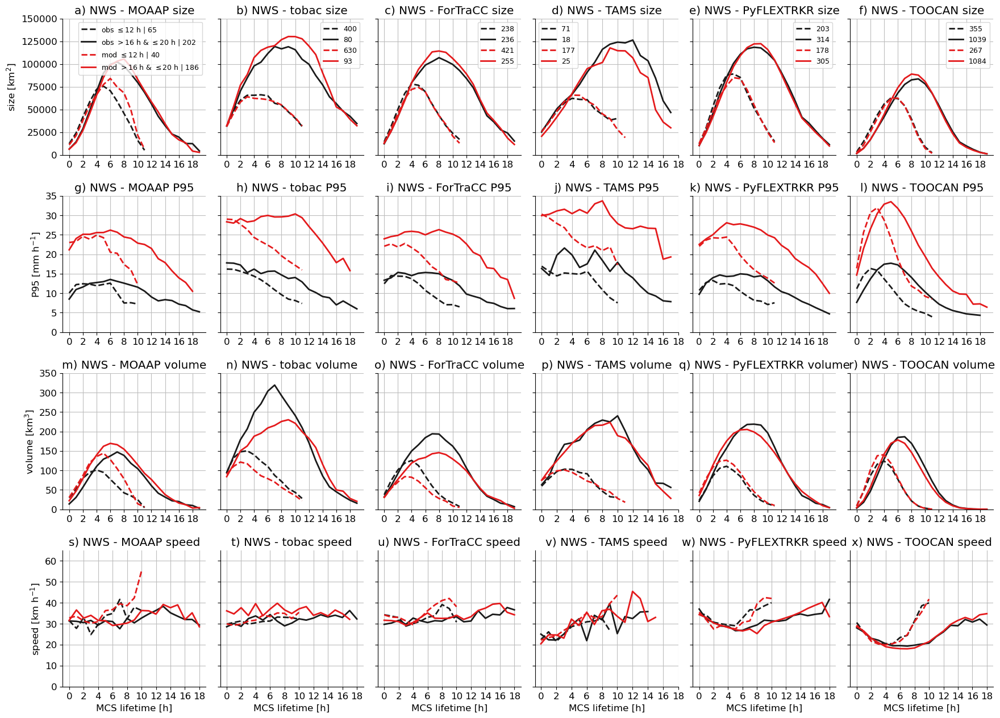

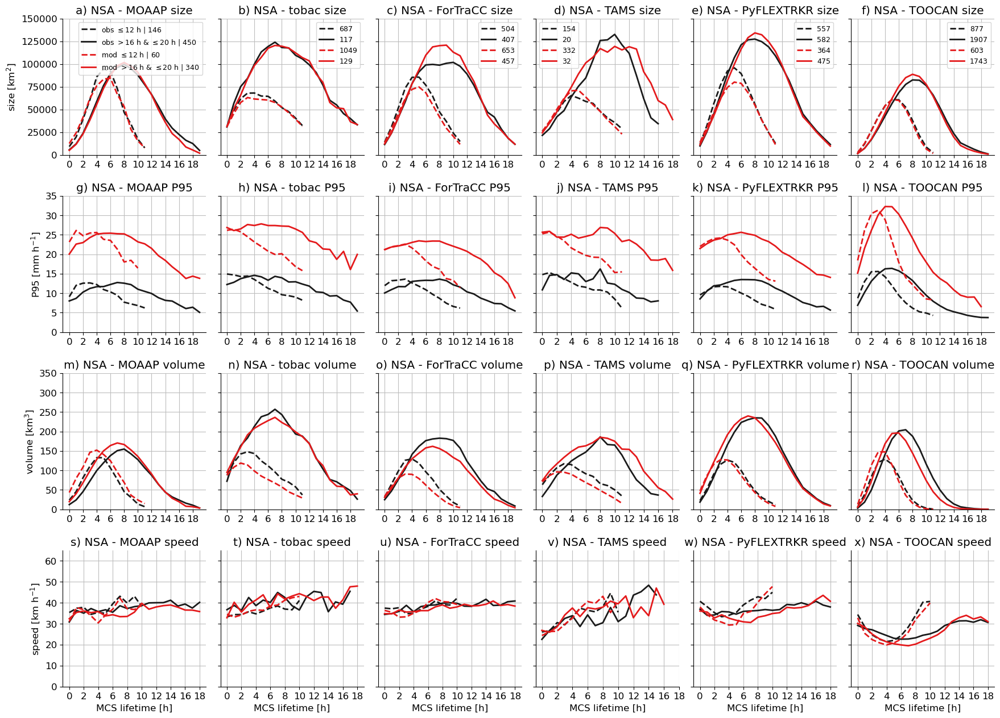

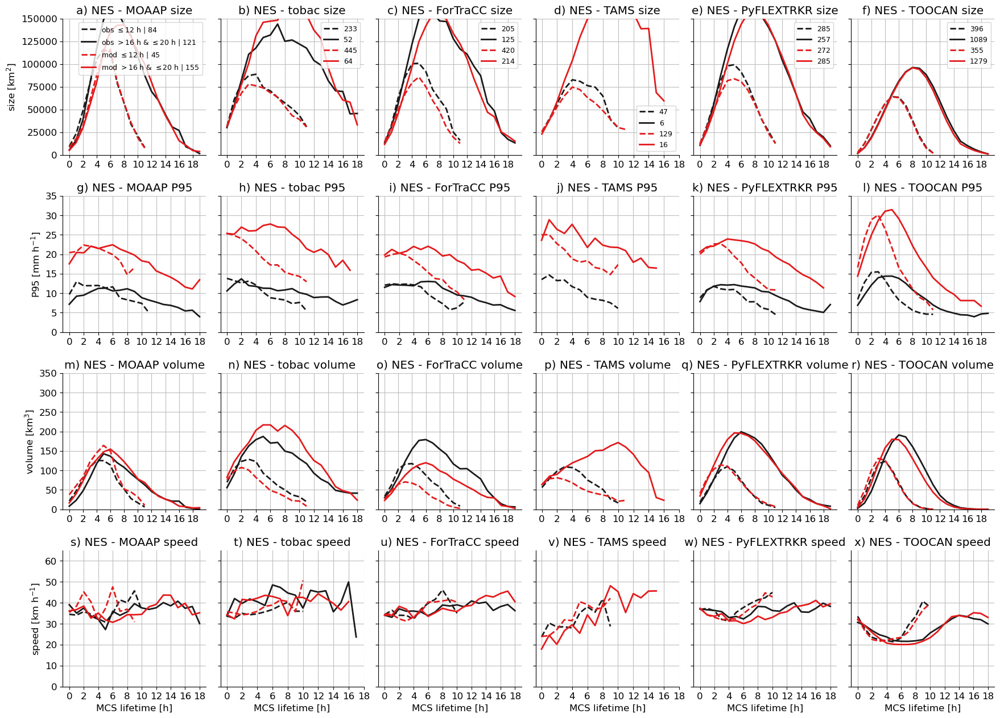

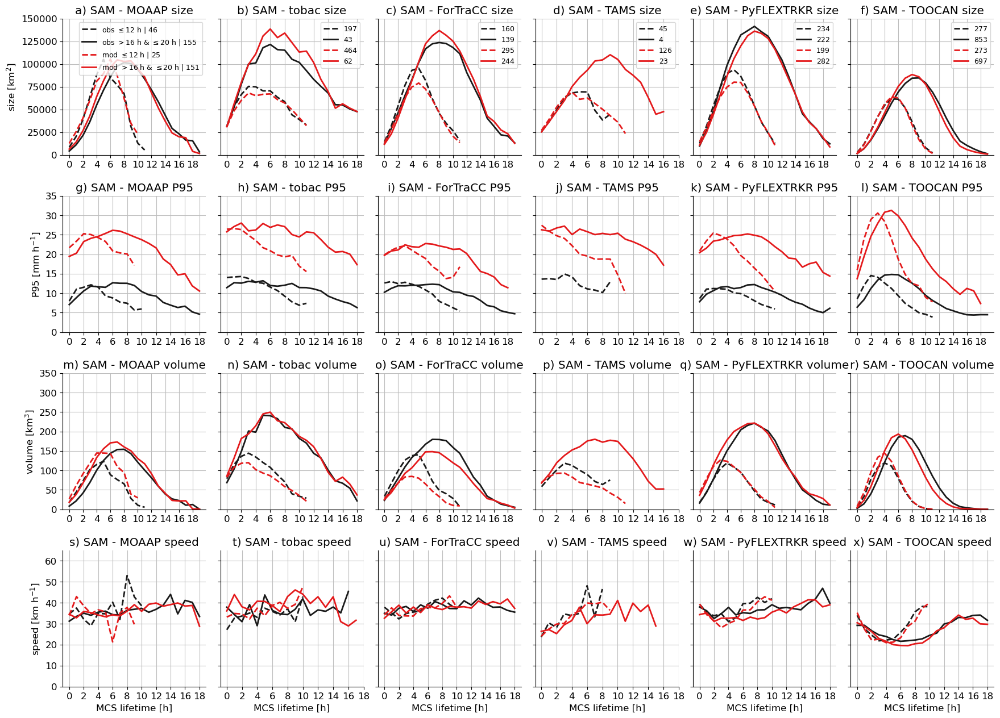

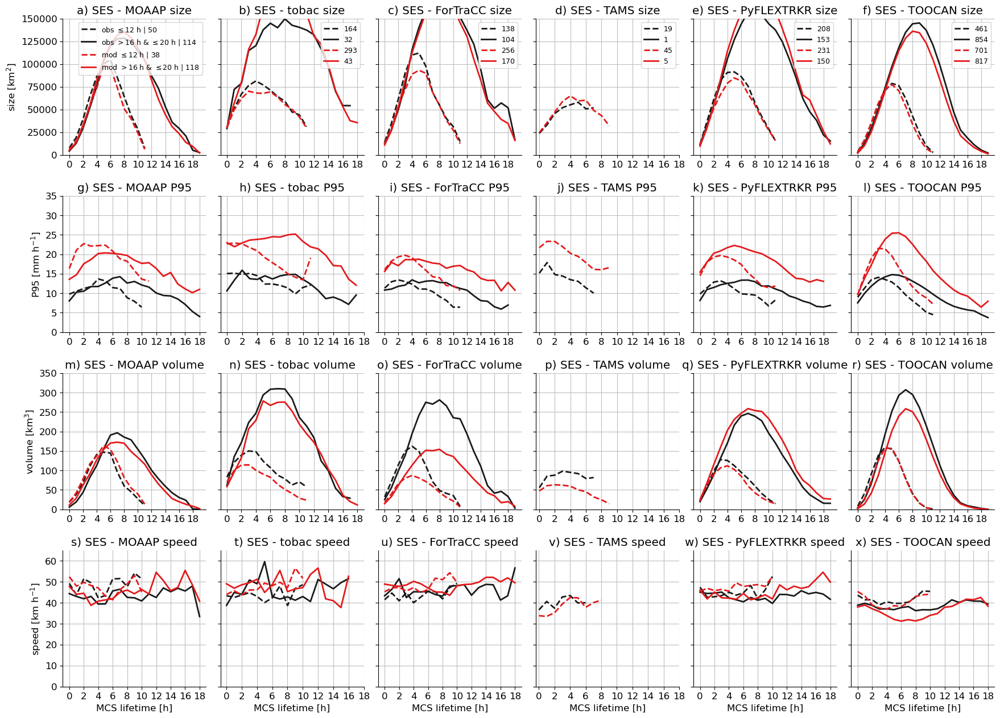

...

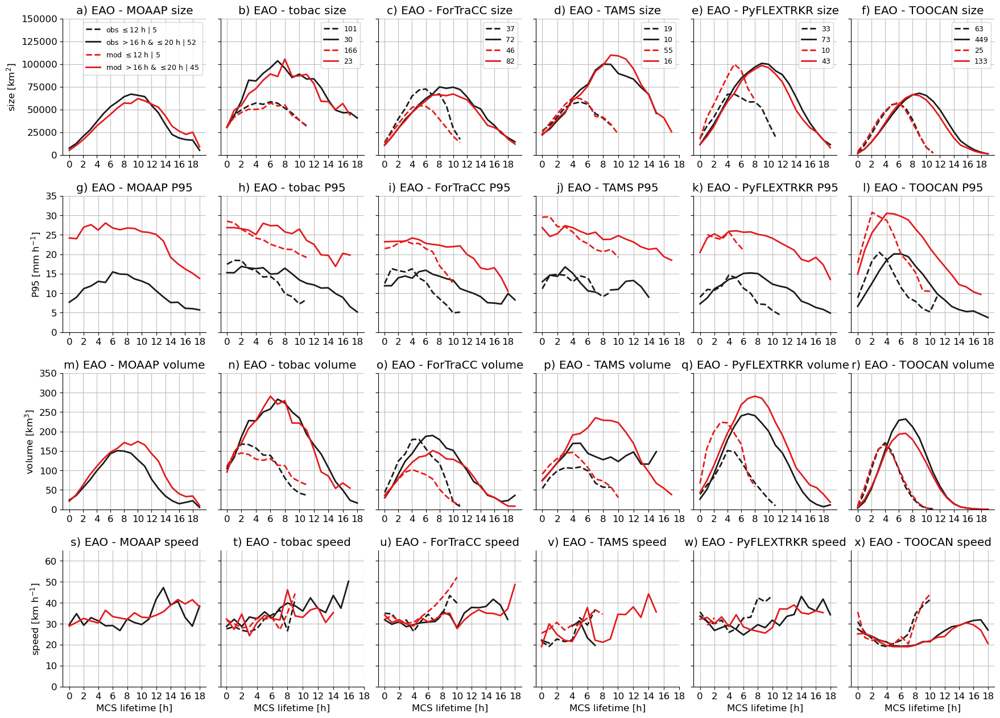

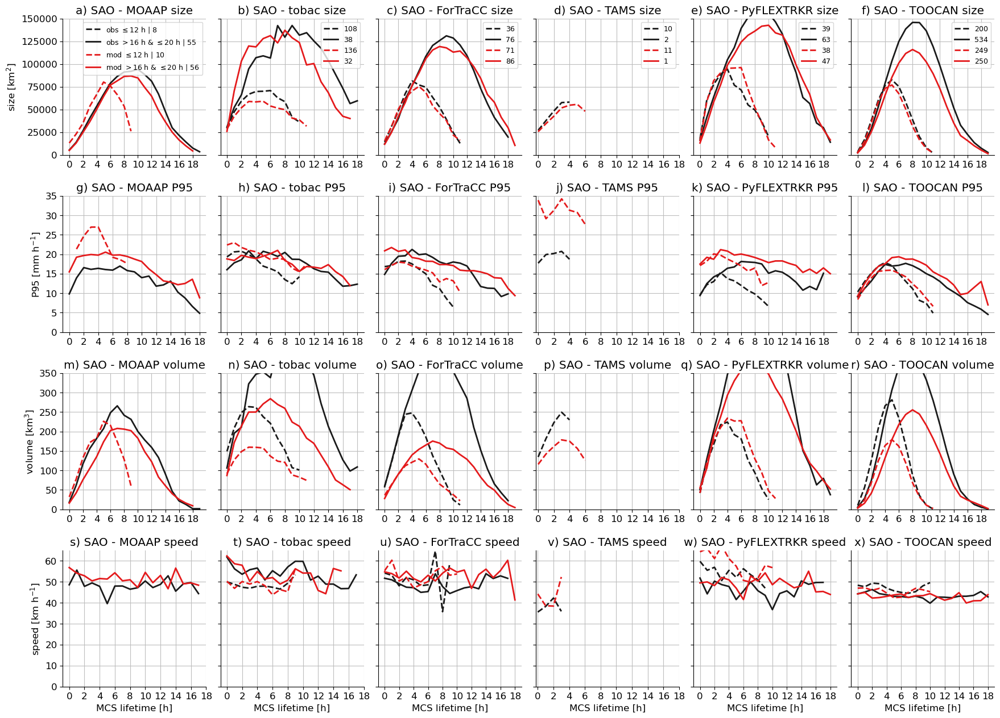

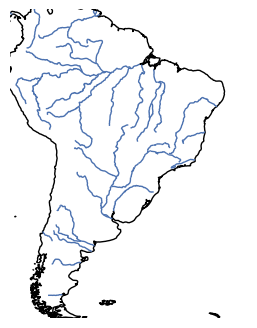

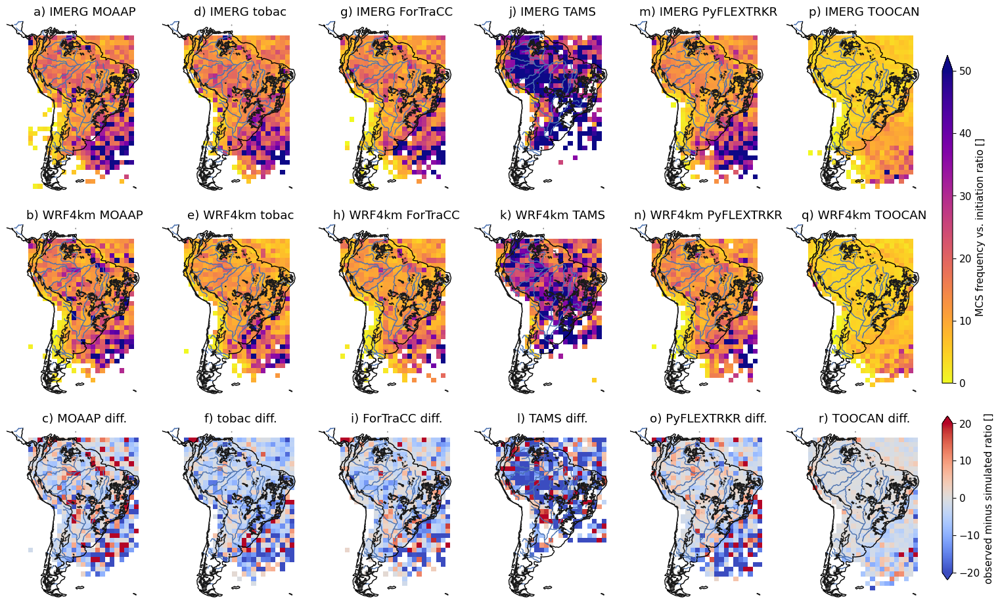

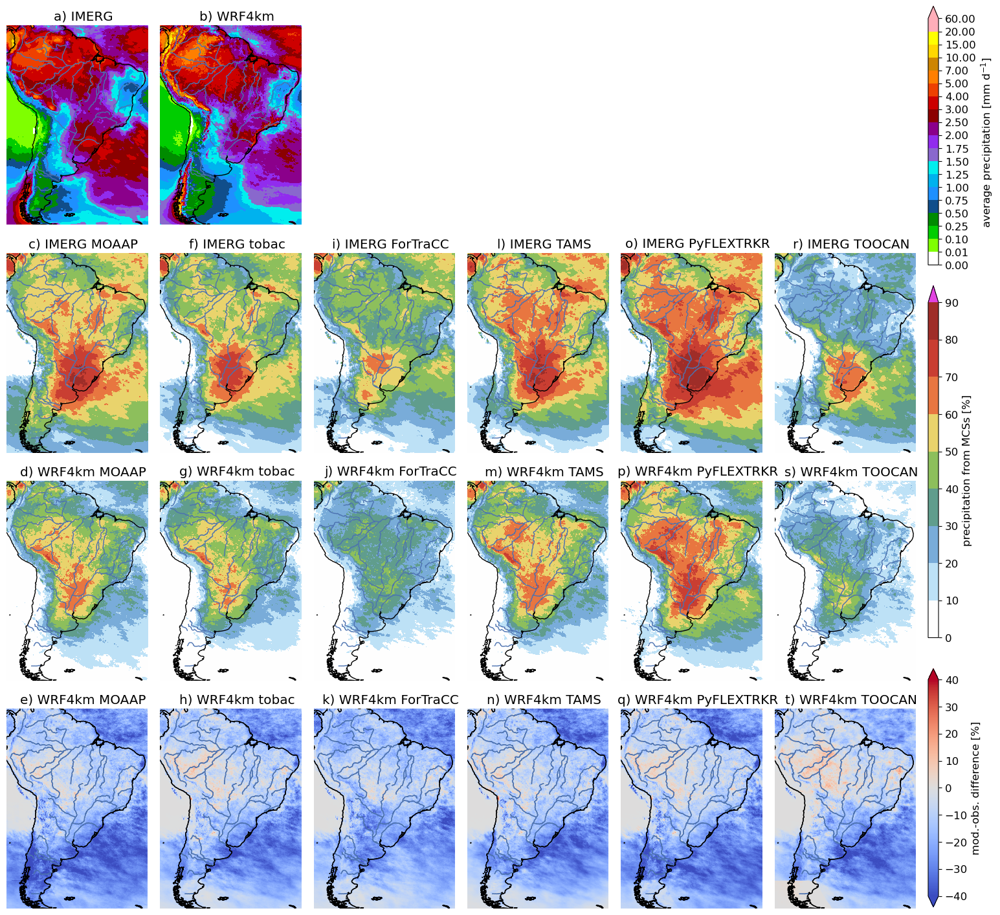

In [34]:
from scipy.ndimage import gaussian_filter
import matplotlib.gridspec as gridspec
# from mpl_toolkits.basemap import Basemap, cm
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
from pylab import *
import string
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import shapefile

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import shapely.geometry as sgeom
from matplotlib.colors import LogNorm

import seaborn as sns
from scipy.stats import kde
import cartopy.feature as cfeature
rivers_50m = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', '50m')


fig = plt.figure(figsize=(16,16))
import seaborn as sns
plt.rcParams.update({'font.size': 12})
# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(4,len(Trackers)) #rgiSize[2])
gs1.update(left=0.06, right=0.95,
           bottom=0.1, top=0.97,
           wspace=0.0, hspace=0.05)

# Plot the MCS Origin in Stage IV and CONUS404
proj = ccrs.PlateCarree() #ccrs.Robinson() 

# --------------------------------
# Plot precipitation from IMERG and WRF
COLORS = ["#ffffff", "#7fff00", "#00cd00", "#008b00", "#104e8b",
   "#1e90ff", "#00b2ee", "#00eeee", "#8968cd", "#912cee",
   "#8b008b", "#8b0000", "#cd0000", "#ee4000", "#ff7f00",
   "#cd8500", "#ffd700", "#ffff00", "#ffaeb9"]
LEVS     = np.array([0., 0.01, 0.1, 0.25, 0.50, 0.75, 1.0, 1.25, 1.50, 1.75, 2.0,
   2.5, 3.0, 4.0, 5.0, 7.0, 10.0, 15.0, 20.0, 60.0])

for da in range(len(NCdataName)):
    ax = plt.subplot(gs1[0,da], projection=proj)
    DATA = np.nansum(rgrPR_total[:,:,:,:,da,0], axis=(0,1))/3
    
    plt.axis('off')
    ax.set_extent((-80, -30, -55, 10), ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

    # contour
    ax.set_title(rgsLableABC[da]+') '+rgsDataSets[da])
    cs = ax.contourf(Lon, Lat, DATA, transform=ccrs.PlateCarree(), colors=COLORS, levels=LEVS, extend='max')

CbarAx = axes([0.95, 0.73, 0.01, 0.25])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='both', ticks=LEVS)
cb.set_label('average precipitation [mm d$^{-1}$]') #, fontsize=12)
#     cb.ax.set_yticklabels(LEVS,rotation=90)
#     cb.set_label(Stats[st]) #, fontsize=12)


# --------------------------------
# Plot the ration of MCS to total precipitation
COLORS = ['#fefefe','#bde1f6','#79acd9','#609d8d','#8dbf5c','#e9d36c',
                      '#e87640','#c93e32','#9f2d28','#e243e1']
LEVS =np.array([0,10,20,30,40,50,60,70,80,90])
for tr in range(len(Trackers)):
    proj = ccrs.PlateCarree() #ccrs.Robinson() 
    for da in range(len(rgsDataSets)):
        ax = plt.subplot(gs1[da+1,tr], projection=proj)
        plt.axis('off')
        ax.set_extent((-80, -30, -55, 10), ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

        pr_from_mcss = (np.nanmean(rgrMCS_PR_total[:,:,:,:,da,tr], axis=(0,1)) /
                        np.nanmean(rgrPR_total[:,:,:,:,da,tr], axis=(0,1)))*100
        
        ax.set_title(rgsLableABC[2+da+tr*3]+') ' + rgsDataSets[da] + ' ' + tracker_names[tr])
        cs = ax.contourf(Lon, Lat, pr_from_mcss, transform=ccrs.PlateCarree(), 
                         colors=COLORS, levels=LEVS, extend='max')

CbarAx = axes([0.95, 0.37, 0.01, 0.34])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='both', ticks=LEVS)
cb.set_label('precipitation from MCSs [%]') #, fontsize=12)


### PLOT OBS - MOD DIFFERENCE
for tr in range(len(Trackers)):
    proj = ccrs.PlateCarree() #ccrs.Robinson() 
    for da in range(len(rgsDataSets)):
        ax = plt.subplot(gs1[3,tr], projection=proj)
        plt.axis('off')
        ax.set_extent((-80, -30, -55, 10), ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

        pr_from_mcss_obs = (np.nanmean(rgrMCS_PR_total[:,:,:,:,0,tr], axis=(0,1)) /
                        np.nanmean(rgrPR_total[:,:,:,:,0,tr], axis=(0,1)))*100
        pr_from_mcss_mod = (np.nanmean(rgrMCS_PR_total[:,:,:,:,1,tr], axis=(0,1)) /
                        np.nanmean(rgrPR_total[:,:,:,:,1,tr], axis=(0,1)))*100
        pr_from_mcss = pr_from_mcss_mod - pr_from_mcss_obs
        
        ax.set_title(rgsLableABC[4+tr*3]+') ' + rgsDataSets[da] + ' ' + tracker_names[tr])
        cs = ax.pcolormesh(Lon, Lat, pr_from_mcss, transform=ccrs.PlateCarree(), 
                         cmap='coolwarm', vmin=-40, vmax=40)

CbarAx = axes([0.95, 0.11, 0.01, 0.23])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='both')
cb.set_label('mod.-obs. difference [%]') #, fontsize=12)

sPlotFile=sPlotDir
sPlotName= 'Fig_10_MCS-precipitation-ratio.jpg'
if os.path.isdir(sPlotFile) != 1:
    subprocess.call(["mkdir","-p",sPlotFile])
fig.savefig(sPlotFile+sPlotName, bbox_inches='tight', dpi=600)
print( '        Plot map to: '+sPlotFile+sPlotName)
plt.show()

In [35]:
sPlotDir

'/glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/'

### ANNUAL FREQUENCY OF MCS CLOUD SHIELDS

In [36]:
from scipy.ndimage import gaussian_filter
import matplotlib.gridspec as gridspec
# from mpl_toolkits.basemap import Basemap, cm
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
from pylab import *
import string
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import shapefile

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import shapely.geometry as sgeom
from matplotlib.colors import LogNorm

import seaborn as sns
from scipy.stats import kde
import cartopy.feature as cfeature
rivers_50m = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', '50m')


fig = plt.figure(figsize=(16,9))
import seaborn as sns
plt.rcParams.update({'font.size': 12})
# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(3,len(Trackers)) #rgiSize[2])
gs1.update(left=0.06, right=0.95,
           bottom=0.1, top=0.97,
           wspace=0.0, hspace=0.05)

# Plot the MCS Origin in Stage IV and CONUS404
proj = ccrs.PlateCarree() #ccrs.Robinson() 


# --------------------------------
# Plot the frequency of how often a grid cell is underneath an MCS cloud shield
COLORS = ['#fefefe','#bde1f6','#79acd9','#609d8d','#8dbf5c','#e9d36c',
                      '#e87640','#c93e32','#9f2d28','#e243e1']
LEVS =np.array([0,10,20,30,40,50,60,70,80,90])
for tr in range(len(Trackers)):
    proj = ccrs.PlateCarree() #ccrs.Robinson() 
    for da in range(len(rgsDataSets)):
        ax = plt.subplot(gs1[da,tr], projection=proj)
        plt.axis('off')
        ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

        pr_from_mcss = np.sum(mcs_frequency[:,:,:,:,da,tr], axis=(0,1))/3
        
        ax.set_title(rgsLableABC[da+tr*3]+') ' + rgsDataSets[da] + ' ' + tracker_names[tr])
        cs = ax.pcolormesh(Lon, Lat, pr_from_mcss, transform=ccrs.PlateCarree(), 
                         cmap='gist_ncar_r', vmin=0, vmax = 1250)

CbarAx = axes([0.95, 0.45, 0.01, 0.5])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='max')
cb.set_label('MCS frequency [hours per year]') #, fontsize=12)


### PLOT OBS - MOD DIFFERENCE
for tr in range(len(Trackers)):
    proj = ccrs.PlateCarree() #ccrs.Robinson() 
    for da in range(len(rgsDataSets)):
        ax = plt.subplot(gs1[2,tr], projection=proj)
        plt.axis('off')
        ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

        pr_from_mcss_obs = pr_from_mcss = np.sum(mcs_frequency[:,:,:,:,0,tr], axis=(0,1))/3
        pr_from_mcss_obs[pr_from_mcss_obs < 25] = np.nan
        pr_from_mcss_mod = pr_from_mcss = np.sum(mcs_frequency[:,:,:,:,1,tr], axis=(0,1))/3
        pr_from_mcss_mod[pr_from_mcss_mod < 25] = np.nan
                 
        pr_from_mcss = ((pr_from_mcss_mod - pr_from_mcss_obs)/pr_from_mcss_obs)*100
        
        ax.set_title(rgsLableABC[2+tr*3]+') ' + rgsDataSets[da] + ' ' + tracker_names[tr])
        cs = ax.pcolormesh(Lon, Lat, pr_from_mcss, transform=ccrs.PlateCarree(), 
                         cmap='coolwarm', vmin=-100, vmax=100)

CbarAx = axes([0.95, 0.11, 0.01, 0.30])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='both')
cb.set_label('mod.-obs. difference [%]') #, fontsize=12)

# sPlotFile=sPlotDir
# sPlotName= str(TimeMM.year[0])+'-'+str(TimeMM.year[-1])+'_MCS-precipitation-ratio.pdf'
# if os.path.isdir(sPlotFile) != 1:
#     subprocess.call(["mkdir","-p",sPlotFile])
# fig.savefig(sPlotFile+sPlotName, bbox_inches='tight') #, dpi=700)
# print( '        Plot map to: '+sPlotFile+sPlotName)

### Plot unique MCS frequency in 1 degree areas

        Plot map to: /glade/u/home/prein/papers/2022-SA-MCS-Tracking/programs/Tracking_Analysis/plots/2010-2019_MCS_frequcney.pdf


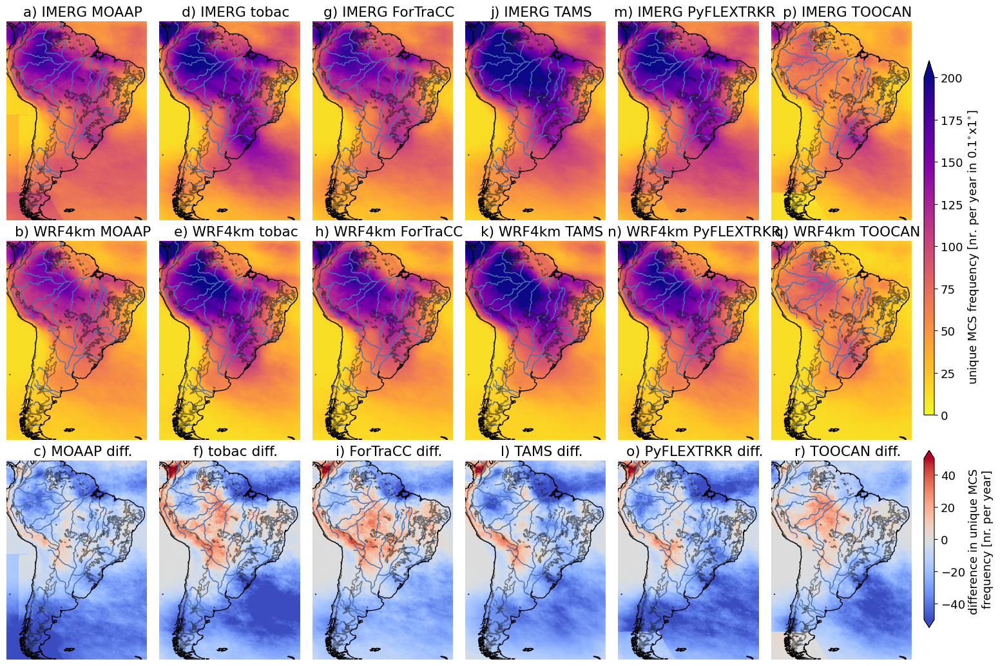

In [50]:
fig = plt.figure(figsize=(16,11))
import seaborn as sns
plt.rcParams.update({'font.size': 13})

# Histogram plots
rgiSize=MCSsPerMonthS4.shape
gs1 = gridspec.GridSpec(3,len(Trackers)) #rgiSize[2])
gs1.update(left=0.06, right=0.95,
           bottom=0.04, top=0.97,
           wspace=0.0, hspace=0.0)

for tr in range(len(Trackers)):
    # --------------------------------
    # Plot the MCS Origin in Stage IV and CONUS404
    proj = ccrs.PlateCarree() #ccrs.Robinson() 

    for da in range(len(rgsDataSets)):
        ax = plt.subplot(gs1[da,tr], projection=proj)
        plt.axis('off')
        ax.set_extent((-80, -30, -55, 10), ccrs.PlateCarree())
        ax.coastlines()
        ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')
#         lat_tr = []
#         lon_tr = []

#         if rgsDataSets[da] == 'IMERG':
#             DATA_LAT = lat_all[Trackers[tr]]
#             DATA_LON = lon_all[Trackers[tr]]
#         else:
#             DATA_LAT = lat_all_mod[Trackers[tr]]
#             DATA_LON = lon_all_mod[Trackers[tr]]

#         # plot OBS Origin
#         sS4_MCSs=list(DATA_LAT.keys())
#         for mc in range(len(list(DATA_LAT.keys()))):
#             lat_lon_tr = np.unique(np.array([np.round(DATA_LAT[sS4_MCSs[mc]], 2), np.round(DATA_LON[sS4_MCSs[mc]],2)]), axis=1)
#             lat_tr = lat_tr + list(lat_lon_tr[0,:])
#             lon_tr = lon_tr + list(lat_lon_tr[1,:])
            
        
#         x = np.array(lat_tr)
#         y = np.array(lon_tr)
#         bins = [np.arange(int(Lat.min()), int(Lat.max()),2),
#                 np.arange(int(Lon.min()), int(Lon.max()),2)]

#         heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
#         heatmap = heatmap/3 # initiations per year
        
#         if da == 0:
#             heatmap_obs = np.copy(heatmap)
#         if da == 1:
#             heatmap_mod = np.copy(heatmap)
            
#         heatmaps_initiation

#         xx = xedges #(xedges[1:]+xedges[:-1])
#         yy = yedges #(yedges[1:]+yedges[:-1])
#         xx, yy = np.meshgrid(xx,yy)
#         cs = plt.pcolormesh(yy[:-1,:-1],
#                            xx[:-1,:-1],
#                            heatmap.T[:-1,:-1],
#                            transform=ccrs.PlateCarree(),
#                            cmap = 'plasma_r',
#                            vmin = 0,
#                            vmax = 300)

        cs = plt.pcolormesh(Lon,
                           Lat,
                           np.sum(mcs_frequency_unique, axis=(0,1))[:,:,da,tr]/3,
                           transform=ccrs.PlateCarree(),
                           cmap = 'plasma_r',
                           vmin = 0,
                           vmax = 200)


        ax.set_title(rgsLableABC[da+tr*3]+') ' + rgsDataSets[da] + ' ' + tracker_names[tr])
        plt.contour(LonE,LatE,HGT, ccrs.PlateCarree(), levels=[500],linewidths=1, colors='k', alpha=0.5)
        
        
    ### ADD PLOT SHOWING DIFFERENCES
    ax = plt.subplot(gs1[2,tr], projection=proj)
    plt.axis('off')
    ax.set_extent((-80, -30, -55, 10), ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(rivers_50m, facecolor='None', edgecolor='b')

#     if rgsDataSets[da] == 'IMERG':
#         DATA_LAT = lat_all[Trackers[tr]]
#         DATA_LON = lon_all[Trackers[tr]]
#     else:
#         DATA_LAT = lat_all_mod[Trackers[tr]]
#         DATA_LON = lon_all_mod[Trackers[tr]]

#     heatmap = heatmap_mod - heatmap_obs

#     xx = (xedges[1:]+xedges[:-1])/2
#     yy = (yedges[1:]+yedges[:-1])/2
#     xx, yy = np.meshgrid(xx,yy)
    cs_b = plt.pcolormesh(Lon,
                       Lat,
                       np.sum(mcs_frequency_unique, axis=(0,1))[:,:,1,tr]/3 -\
                       np.sum(mcs_frequency_unique, axis=(0,1))[:,:,0,tr]/3,
                       transform=ccrs.PlateCarree(),
                       cmap = 'coolwarm',
                       vmin = -50,
                       vmax = 50)

    ax.set_title(rgsLableABC[2+tr*3]+') ' + tracker_names[tr] + ' diff.')
    plt.contour(LonE,LatE,HGT, ccrs.PlateCarree(), levels=[500],linewidths=1, colors='k', alpha=0.5)
        
        
CbarAx = axes([0.95, 0.4, 0.01, 0.5])
cb = colorbar(cs, cax = CbarAx, orientation='vertical', extend='max')#, ticks=np.linspace(0,0.0015,41))
# cb.ax.set_xticklabels(LEVS,rotation=90)
cb.set_label('unique MCS frequency [nr. per year in 0.1$^{\circ}$x1$^{\circ}$]') #, fontsize=12)

CbarAx = axes([0.95, 0.1, 0.01, 0.25])
cb = colorbar(cs_b, cax = CbarAx, orientation='vertical', extend='both')#, ticks=np.linspace(0,0.0015,41))
# cb.ax.set_xticklabels(LEVS,rotation=90)
cb.set_label('difference in unique MCS \nfrequency [nr. per year]') #, fontsize=12)

sPlotFile=sPlotDir
sPlotName= str(TimeMM.year[0])+'-'+str(TimeMM.year[-1])+'_MCS_frequcney.pdf'
if os.path.isdir(sPlotFile) != 1:
    subprocess.call(["mkdir","-p",sPlotFile])
fig.savefig(sPlotFile+sPlotName, bbox_inches='tight') #, dpi=700)

print( '        Plot map to: '+sPlotFile+sPlotName)
plt.show()

### Movie that shows tracks in animation

In [ ]:
sPlotFile+sPlotName

In [ ]:
HHlag = 7*24 # 14 day lag before the track fades

FocusTime = rgdTimeST4 #pd.date_range(datetime.datetime(2018, 11, 1,0), end=datetime.datetime(2018, 11, 30,23), freq='h')

S4MCStime = np.array(S4MCStime)
for hh in range(2000,2100,1)[::4]: #np.where(FocusTime.month >= 0)[0][::4]:  #range(1,len(FocusTime),1):
    sPlotFile='/glade/u/home/prein/papers/2020_SouthAmerica/plots/MCS_Animation/'
    sPlotName= str(hh).zfill(4)+'_MCS-IMERG-WRF-SA4km_'+str(FocusTime[hh])[:10]+'.jpg'
    if os.path.exists(sPlotFile+sPlotName) == False:

        proj = ccrs.PlateCarree() #ccrs.Robinson() 
    
        fig = plt.figure(figsize=(7,9))

        gs1 = gridspec.GridSpec(1,1)
        gs1.update(left=0.06, right=0.97,
                   bottom=0.05, top=0.95,
                   wspace=0.40, hspace=0.40)
        ax = plt.subplot(gs1[0,0], projection=proj)
        plt.axis('off')
        ax.set_extent((-90, -25, -60, 15), ccrs.PlateCarree())
        ax.coastlines()


        if hh-HHlag < 0:
            start = 0
        else:
            start = hh-HHlag
        # plot Stage 4
        rgiMCSs = np.array([(S4MCStime[ii] <= iTimeS4[hh]) & (S4MCStime[ii] >= iTimeS4[start]) for ii in range(len(S4MCStime))])
        iMCSs = np.array([np.max(rgiMCSs[ii]) for ii in range(len(rgiMCSs))])
        if np.sum(iMCSs == True) > 0:
            SelMCS = np.array(S4MCStime)[(iMCSs == True)]
            LatSel = np.array(S4LatMCS)[np.where(iMCSs == True)]
            LonSel = np.array(S4LonMCS)[np.where(iMCSs == True)]
            for mc in range(SelMCS.shape[0]):
                TTact = SelMCS[mc]
                iTact = TTact[(TTact <= iTimeS4[hh]) & (TTact >= iTimeS4[start])]
                try:
                    LonAct = np.array(LonSel[mc])[(TTact <= iTimeS4[hh]) & (TTact >= iTimeS4[start])]
                    LatAct = np.array(LatSel[mc])[(TTact <= iTimeS4[hh]) & (TTact >= iTimeS4[start])]

                    ALPHA = 1-np.array(iTimeS4[hh]-iTact)/HHlag
                    LineWIDTH = ALPHA*3
                    for tt in range(len(LonAct)-1):
                        ax.plot([LonAct[tt],LonAct[tt+1]],[LatAct[tt],LatAct[tt+1]], c='k', lw=LineWIDTH[tt], alpha=ALPHA[tt], transform=ccrs.PlateCarree())
                except:
                    continue
        # plot CONUS404
        rgiMCSs = np.array([(_modMCStime[ii] <= iTimeS4[hh]) & (_modMCStime[ii] >= iTimeS4[start]) for ii in range(len(_modMCStime))])
        iMCSs = np.array([np.max(rgiMCSs[ii]) for ii in range(len(rgiMCSs))])
        if np.sum(iMCSs == True) > 0:
            SelMCS = np.array(_modMCStime)[(iMCSs == True)]
            LatSel = np.array(_modLatMCS)[np.where(iMCSs == True)]
            LonSel = np.array(_modLonMCS)[np.where(iMCSs == True)]
            for mc in range(SelMCS.shape[0]):
                TTact = SelMCS[mc]
                iTact = TTact[(TTact <= iTimeS4[hh]) & (TTact >= iTimeS4[start])]
                try:
                    LonAct = np.array(LonSel[mc])[(TTact <= iTimeS4[hh]) & (TTact >= iTimeS4[start])]
                    LatAct = np.array(LatSel[mc])[(TTact <= iTimeS4[hh]) & (TTact >= iTimeS4[start])]

                    ALPHA = 1-np.array(iTimeS4[hh]-iTact)/HHlag
                    LineWIDTH = ALPHA*3
                    for tt in range(len(LonAct)-1):
                        ax.plot([LonAct[tt],LonAct[tt+1]],[LatAct[tt],LatAct[tt+1]], c='#e31a1c', lw=LineWIDTH[tt], alpha=ALPHA[tt], transform=ccrs.PlateCarree())
                except:
                    continue    

        plt.title(str(FocusTime[hh])[:10], fontsize=14)

        # Save the plot
        if os.path.isdir(sPlotFile) != 1:
            subprocess.call(["mkdir","-p",sPlotFile])
        print( '        Plot map to: '+sPlotFile+sPlotName)
        fig.savefig(sPlotFile+sPlotName) #, dpi=700)
